In [1]:
import pandas as pd, networkx as nx
from pandas.plotting import autocorrelation_plot
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('../')
import trace_analysis
import os
import trace_statistics 

# 1st Trace of Normal Network
## All nodes operating
Parse the 1st trace file with 200 packets over a network without any attacker.

In [2]:
nodes1, hops1 = trace_analysis.process_iotlab_node_by_node(os.getcwd() + '/traces/', '2019-01JAN-30-1')
std_values1, outliers1 = trace_analysis.separate_outliers_node_by_node(nodes1)

../trace_analysis.py:248: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rank['rank'] = rank['rank'].convert_objects(convert_numeric=True)


In [3]:
nodes1.head(10)

,m3-105,m3-113,m3-118,m3-126,m3-129,m3-134,m3-137,m3-142,m3-145,m3-150,m3-153,m3-161,m3-166,m3-169,m3-174,m3-179,m3-182,m3-185,m3-188,m3-97
seq,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.920,NaN,NaN,NaN,66.632,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.249,NaN,40.531,NaN,8.461,7.487,53.667,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.737,NaN,11.013,NaN,7.503,NaN,9.768,50.294,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.949,33.254,8.775,NaN,9.427,NaN,8.810,NaN,NaN,52.533,NaN
5,NaN,NaN,NaN,NaN,69.188,NaN,NaN,NaN,NaN,NaN,9.174,7.822,NaN,9.101,NaN,9.131,NaN,10.391,21.007,NaN
6,NaN,NaN,NaN,NaN,22.579,NaN,NaN,NaN,NaN,39.275,9.493,9.735,NaN,9.421,NaN,9.139,NaN,10.711,19.730,NaN
7,NaN,66.558,NaN,NaN,25.139,NaN,NaN,NaN,NaN,21.533,9.493,8.776,36.931,10.061,NaN,10.092,NaN,13.197,16.855,NaN
8,NaN,40.412,75.869,NaN,20.701,NaN,NaN,NaN,NaN,23.181,10.776,11.015,11.064,8.147,NaN,9.452,NaN,13.519,20.053,NaN
9,NaN,24.386,NaN,NaN,25.174,NaN,NaN,NaN,NaN,30.726,10.142,14.670,9.464,11.343,10.370,12.148,NaN,13.838,20.054,NaN


Produce Histogram of delay depending on the hop-distance from the root

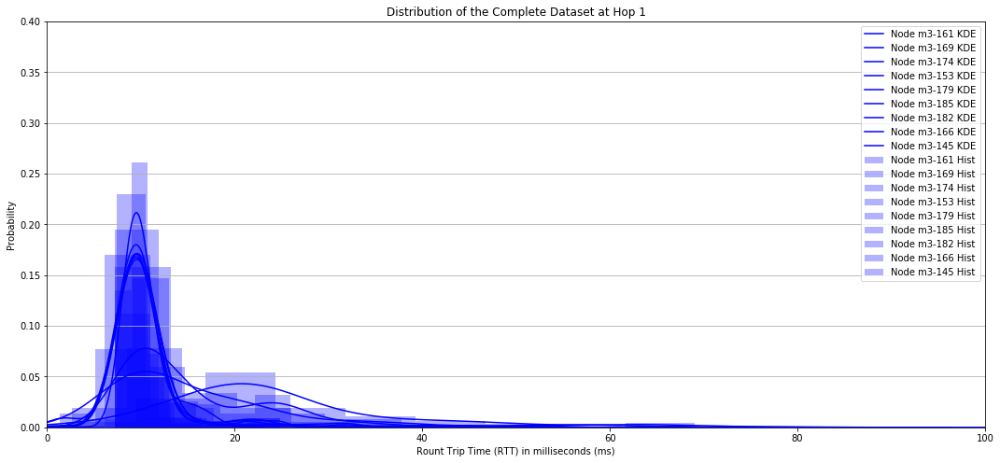

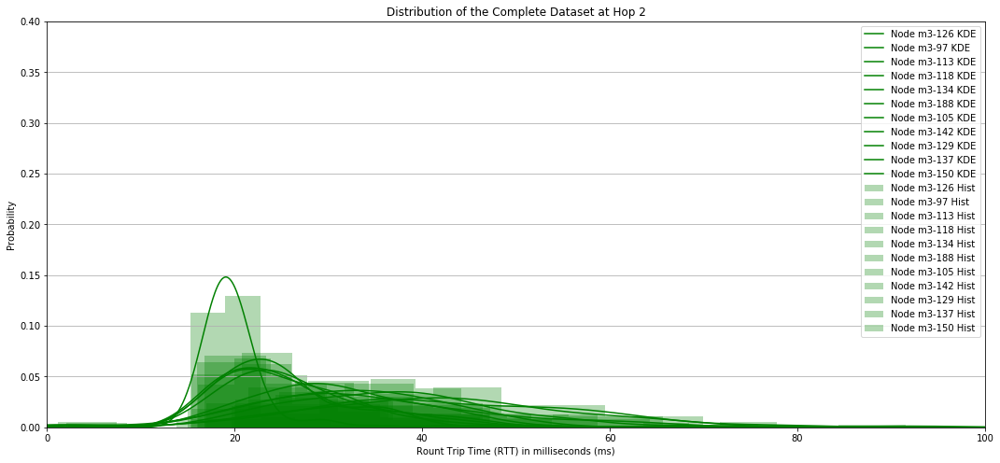

In [4]:
color = ['', 'blue', 'green', 'red']


for hop in hops1.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops1[hop]:
        nodes1[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        nodes1[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Complete Dataset at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

Considering the clean data, produce a histogram of delay depending on the hop-distance from the root 

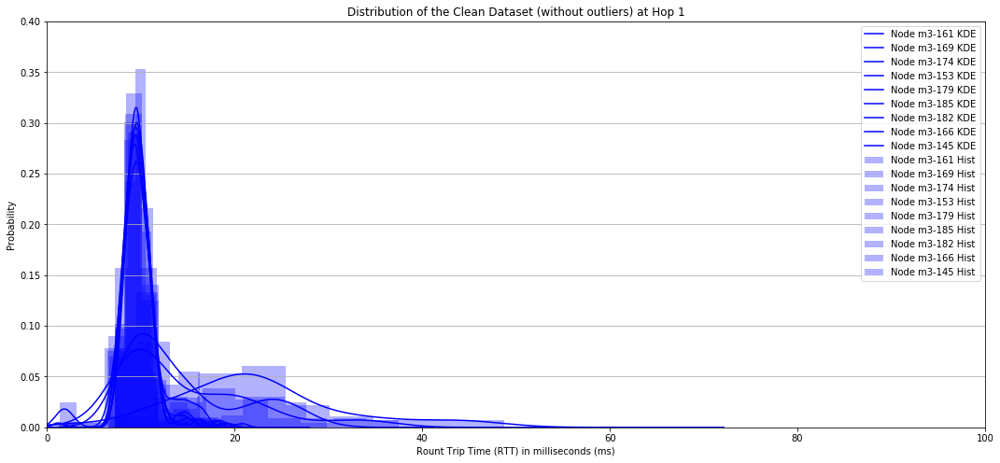

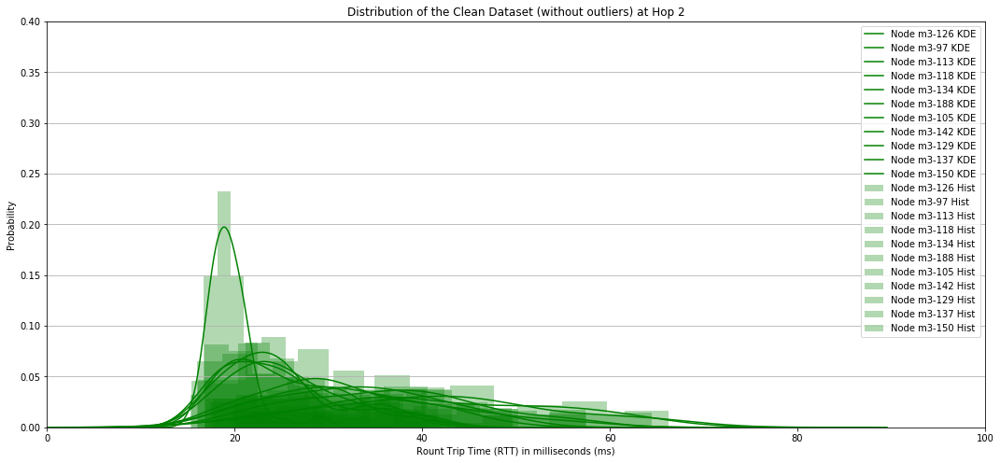

In [5]:
for hop in hops1.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops1[hop]:
        std_values1[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        std_values1[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Clean Dataset (without outliers) at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

Produce a histogram of the outliers depending on the hop-distance from the root 

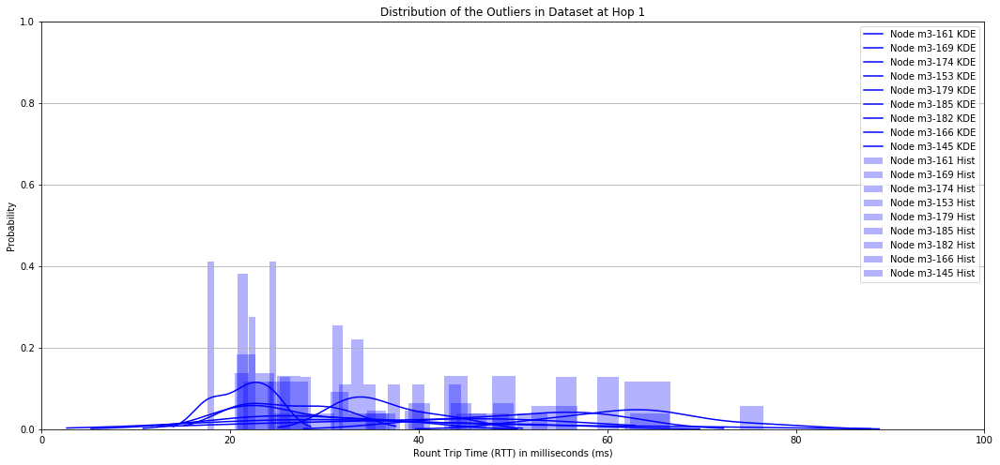

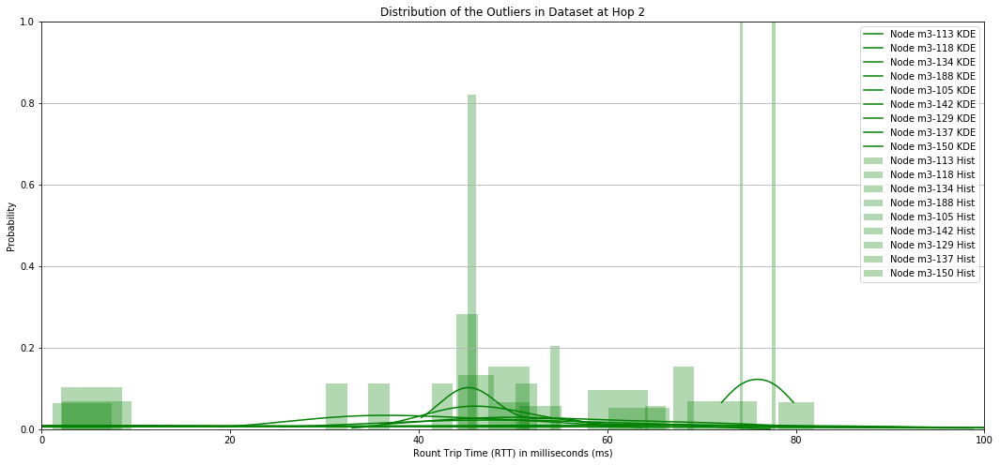

In [6]:
for hop in hops1.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops1[hop]:
        if len(outliers1[node].dropna()) > 1:
            outliers1[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
            outliers1[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Outliers in Dataset at Hop ' +str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,1])
    ax.legend()
    plt.show()

Produce a visualization of a tumbling/rolling windows

/Users/lucamaiano/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


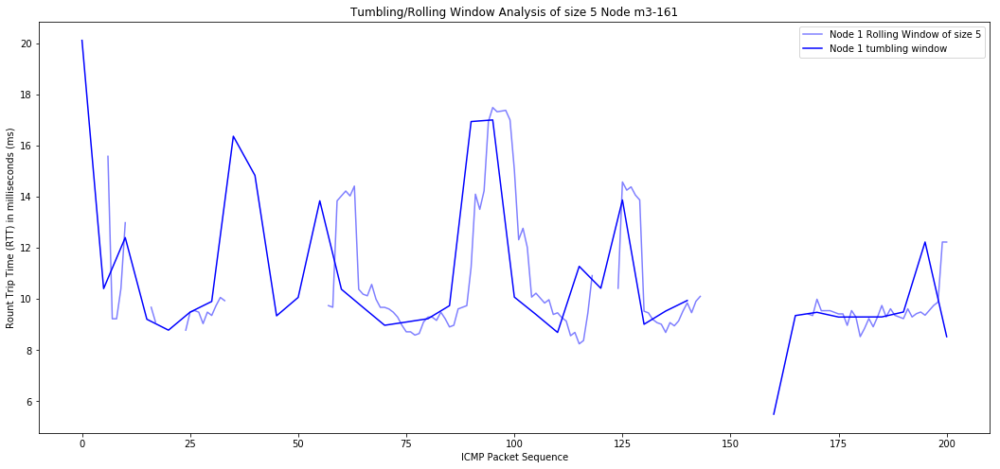

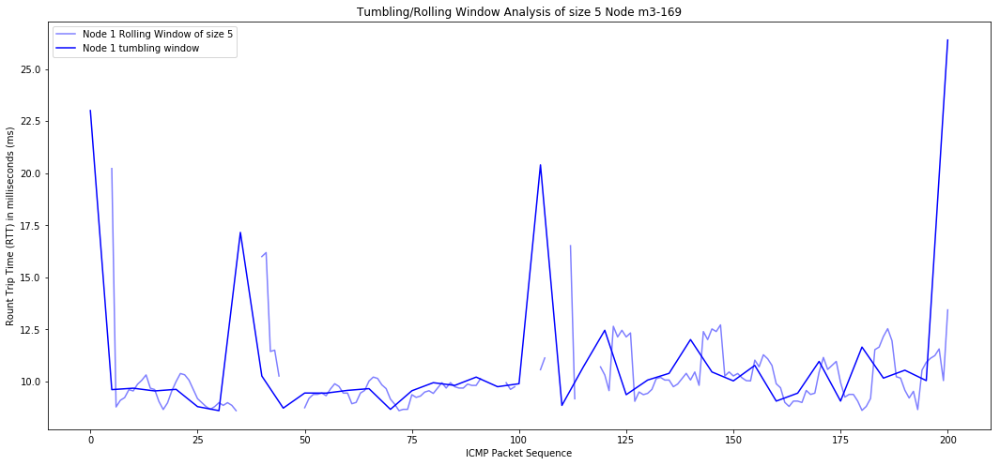

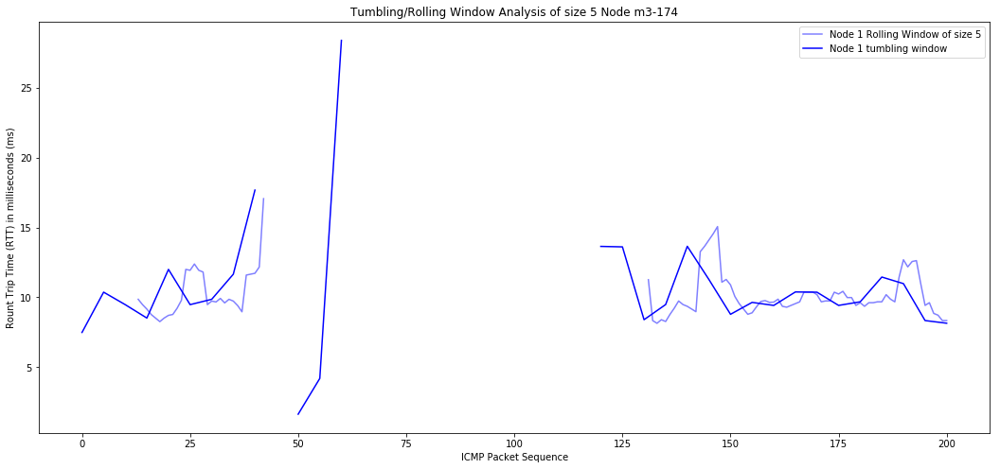

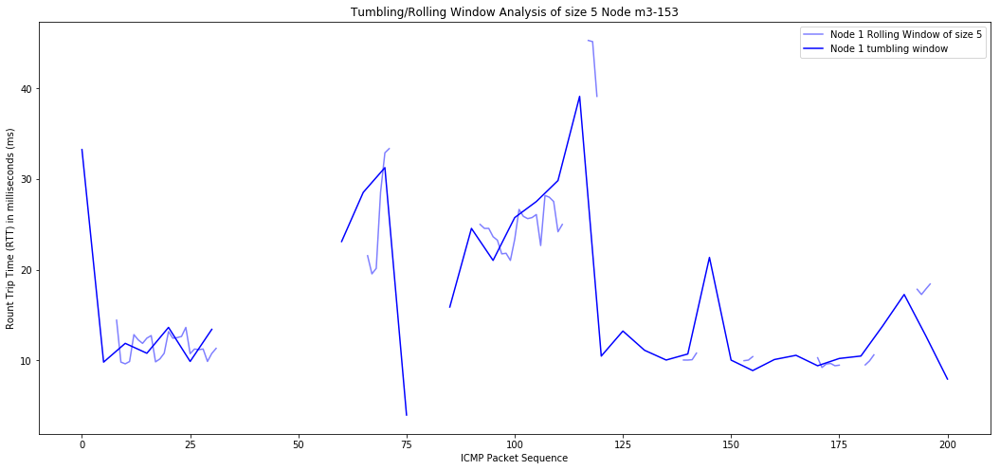

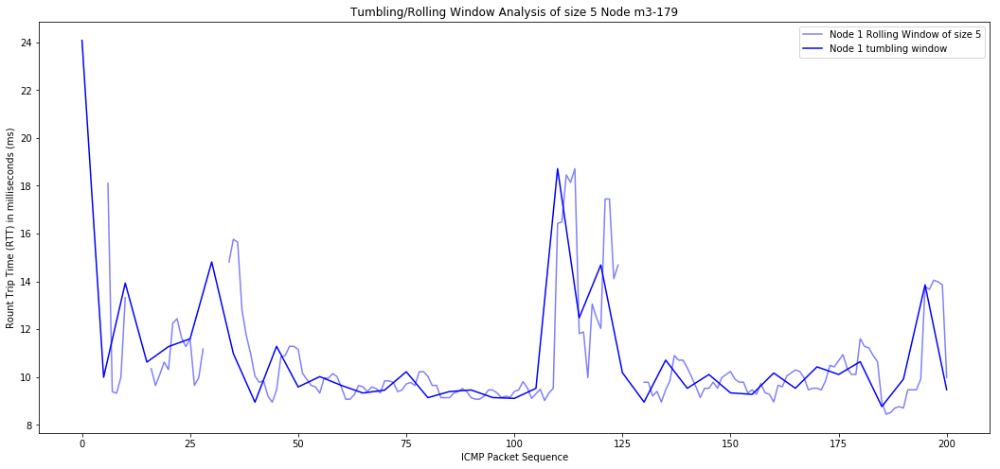

...

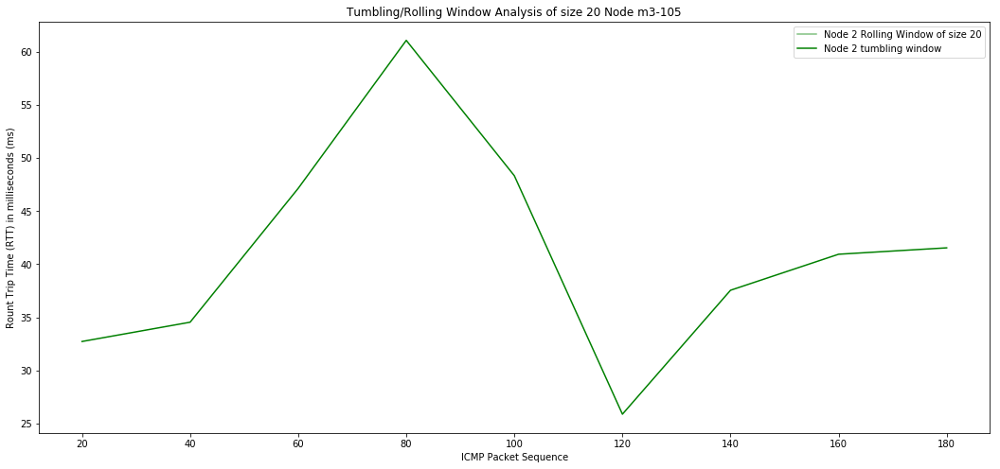

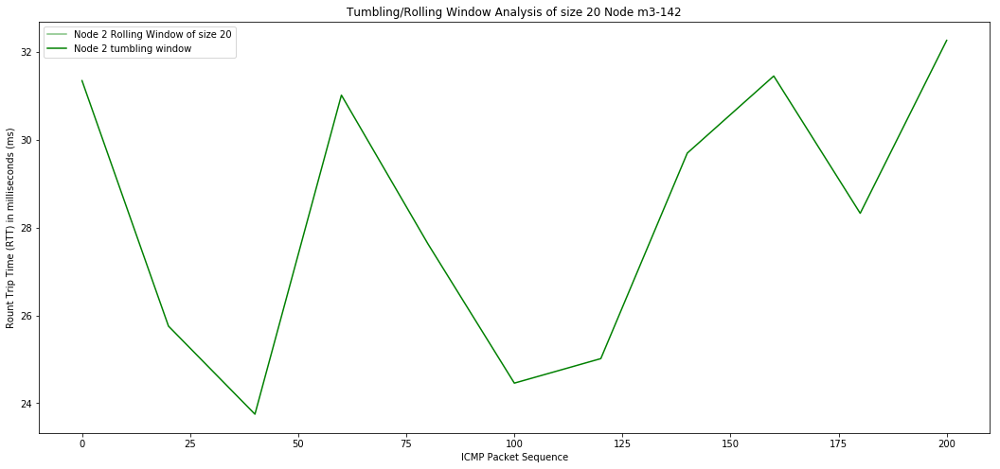

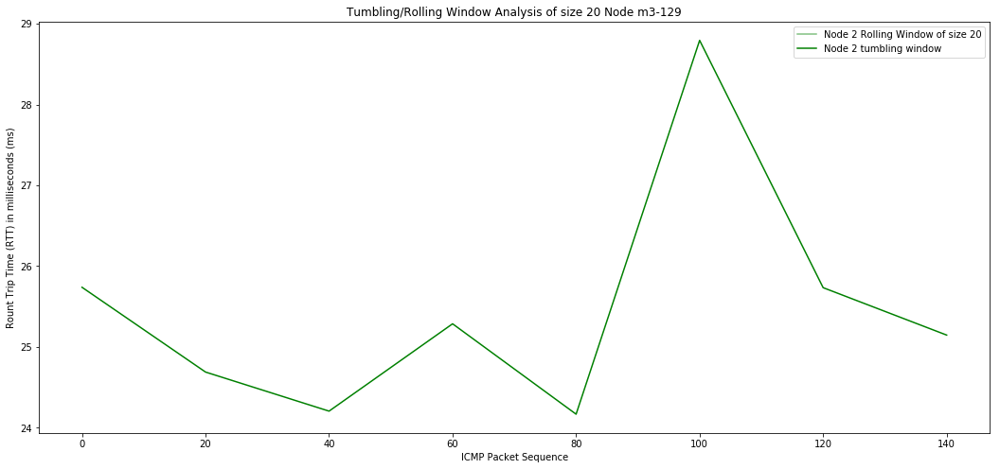

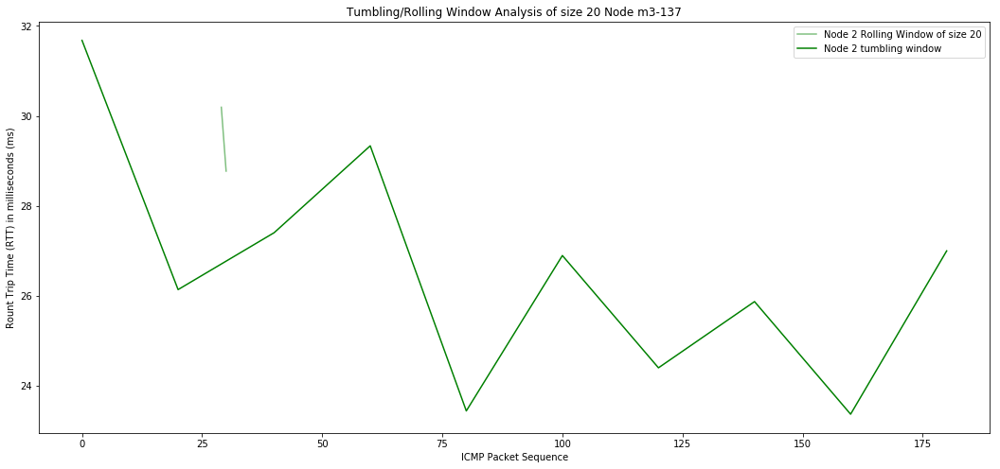

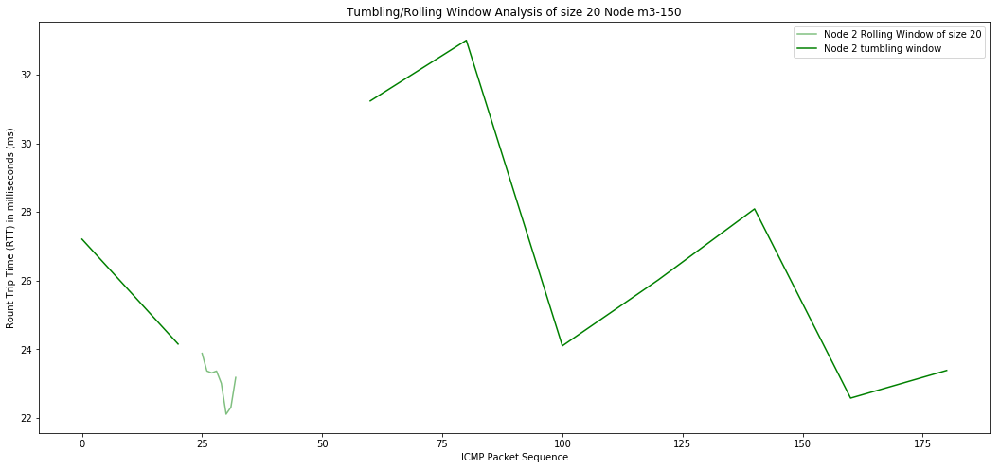

In [7]:
for hop in hops1.keys():
    for window_size in [5, 10, 20]: 
        for node in hops1[hop]:
            fig, ax = plt.subplots(figsize=(18, 8))
            plt.ylabel('Rount Trip Time (RTT) in milliseconds (ms)')
            plt.xlabel('ICMP Packet Sequence')

            plt.plot(nodes1[node].rolling(window_size).mean(), color=color[hop], alpha=0.5, label='Node ' + str(hop) + ' Rolling Window of size ' + str(window_size))
            plt.plot(nodes1[node].groupby(nodes1[node].index // window_size * window_size).mean(), color=color[hop], label='Node ' + str(hop) + ' tumbling window')

            plt.title('Tumbling/Rolling Window Analysis of size ' + str(window_size) + ' Node ' + str(node))
            plt.legend()

Visualize network topology

../trace_analysis.py:159: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['node_id'] = addr['node_id'].convert_objects(convert_numeric=True)
../trace_analysis.py:175: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['rank'] = rank['rank'].convert_objects(convert_numeric=True)
../trace_analysis.py:190: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rpl['node_id'] = rpl['node_id'].convert_objects(convert_numeric=True)


<Figure size 432x288 with 0 Axes>

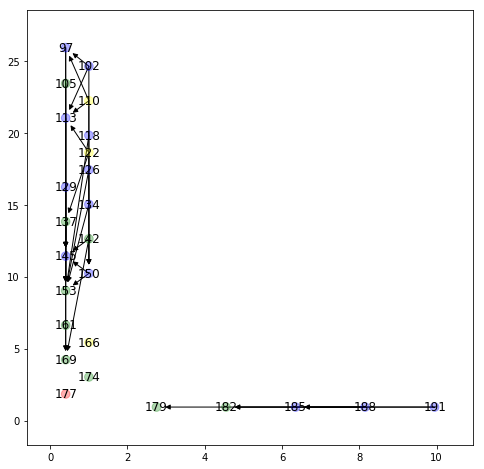

In [8]:
G1 = trace_analysis.produce_iotlab_topology(os.getcwd() + '/traces/', '2019-01JAN-30-1')

plt.clf()
fig = plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(G1, pos=nx.get_node_attributes(G1,'loc'), node_shape='.', node_color=list(nx.get_node_attributes(G1,'color').values()), alpha=0.3)
nx.draw_networkx_labels(G1, pos=nx.get_node_attributes(G1,'loc'), labels=nx.get_node_attributes(G1,'id'))
nx.draw_networkx_edges(G1, pos=nx.get_node_attributes(G1,'loc'))
plt.show()

## Disconnection of 1 node
Parse the 2nd trace file with 200 packets over a network with 1 node disconnection (node 169).

In [9]:
nodes2, hops2 = trace_analysis.process_iotlab_node_by_node(os.getcwd() + '/traces/', '2019-01JAN-30-1b169')
std_values2, outliers2 = trace_analysis.separate_outliers_node_by_node(nodes2)

../trace_analysis.py:248: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rank['rank'] = rank['rank'].convert_objects(convert_numeric=True)


Considering the clean data, produce a histogram of delay depending on the hop-distance from the root 

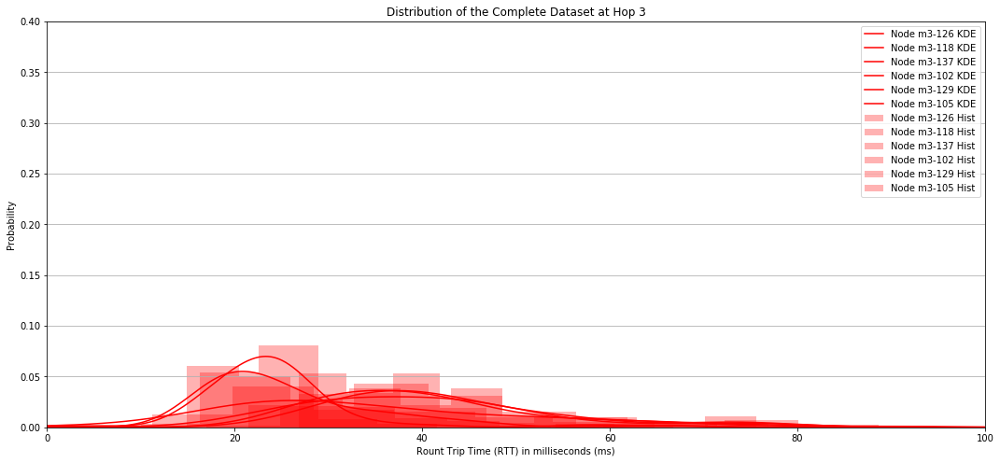

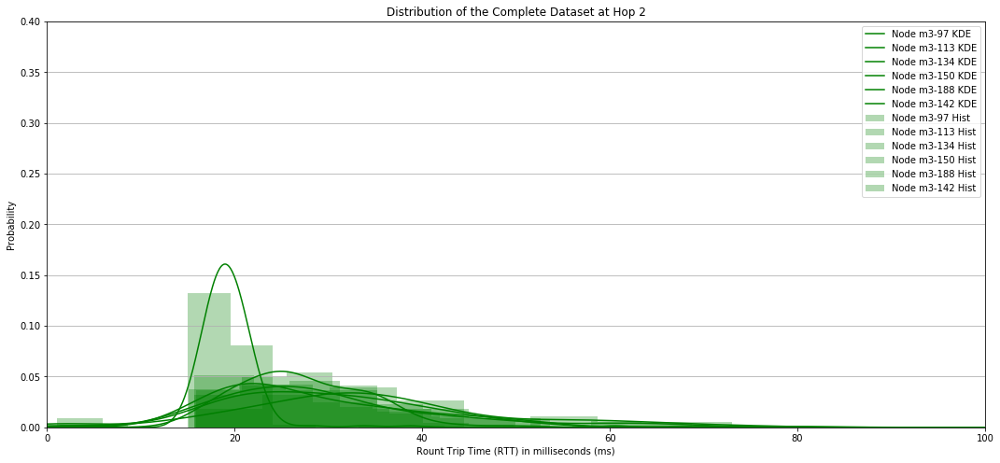

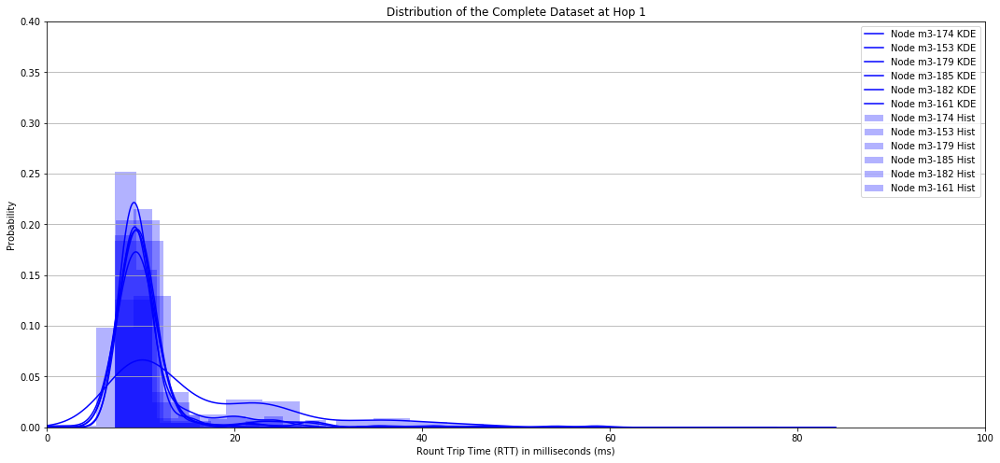

In [10]:
for hop in hops2.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops2[hop]:
        nodes2[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        nodes2[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Complete Dataset at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

Examine original data

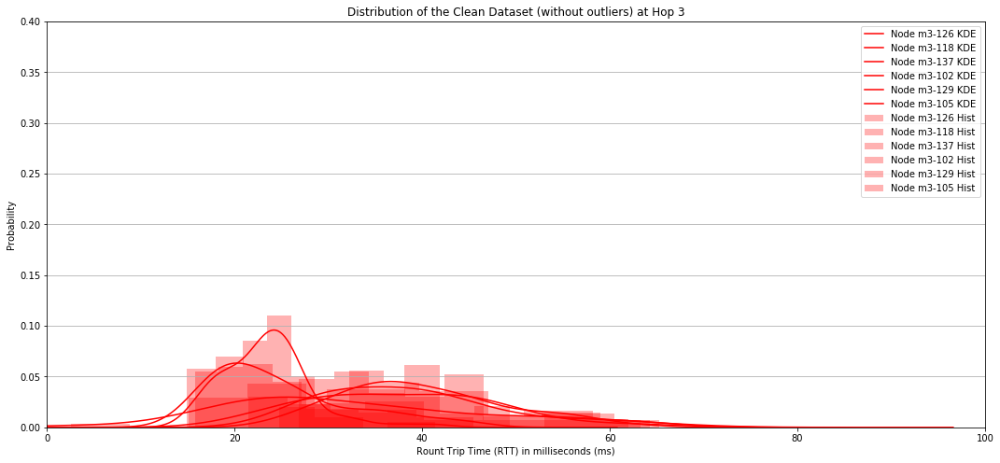

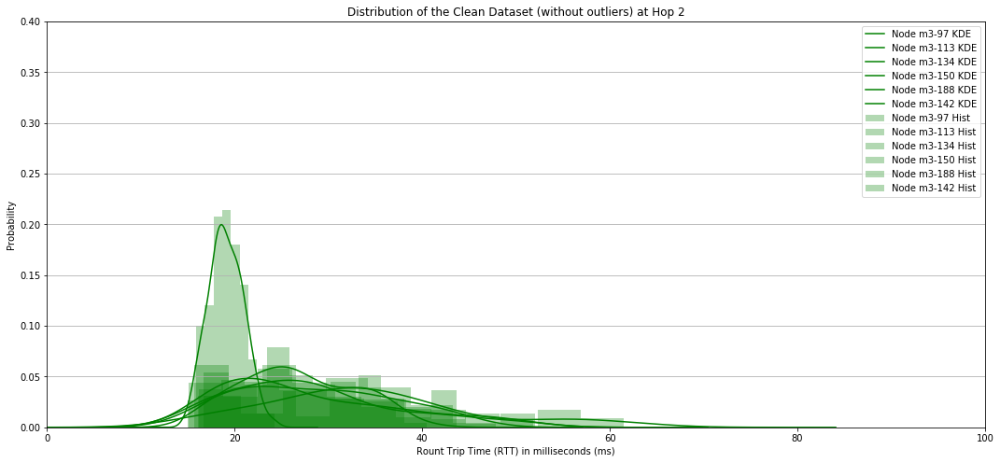

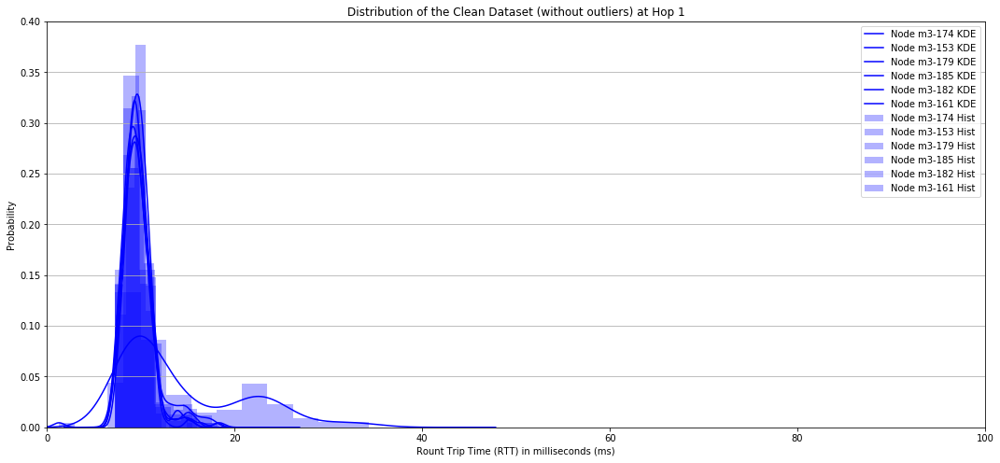

In [11]:
for hop in hops2.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops2[hop]:
        std_values2[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        std_values2[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Clean Dataset (without outliers) at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

Outliers

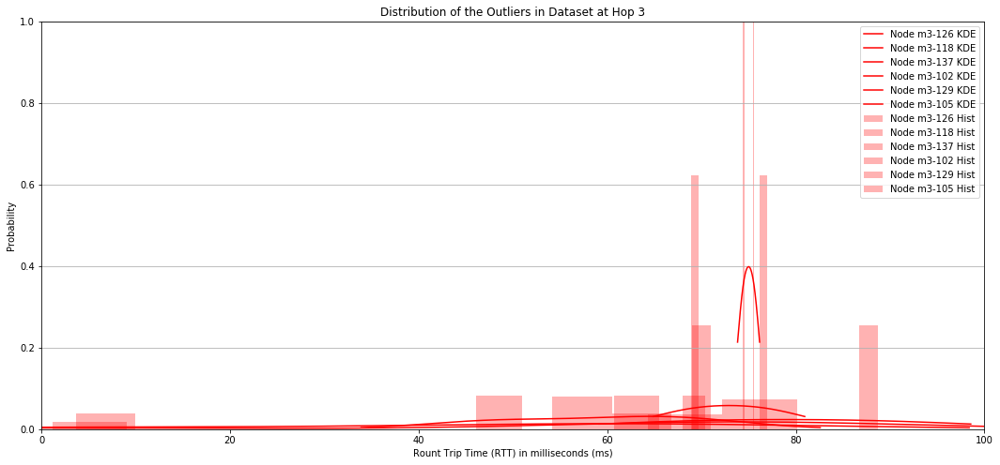

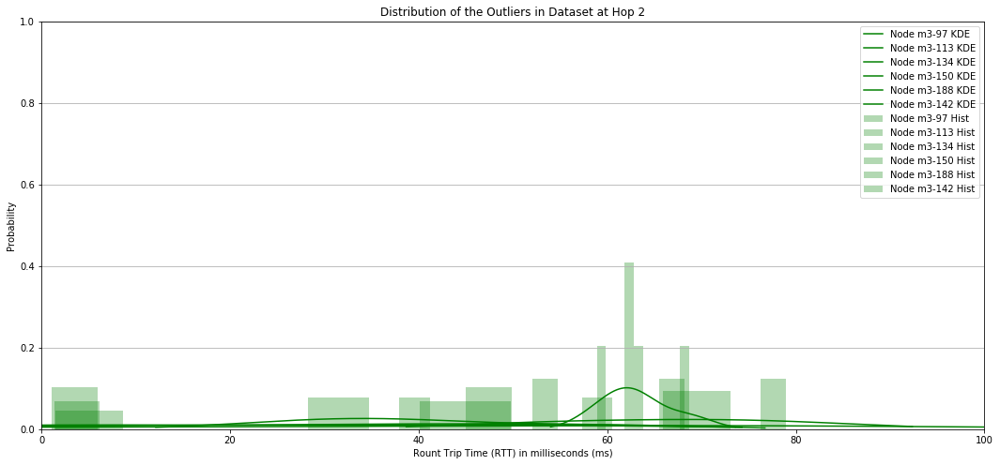

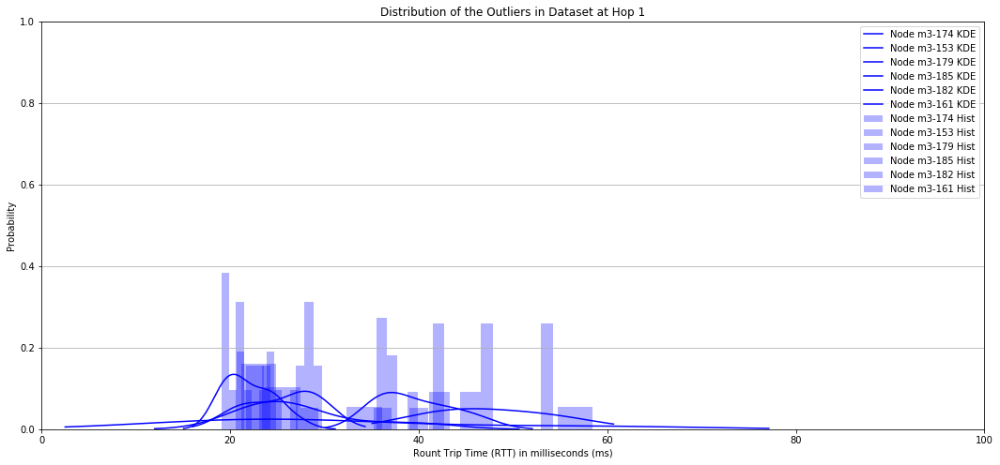

In [12]:
for hop in hops2.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops2[hop]:
        if len(outliers2[node].dropna()) > 1:
            outliers2[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
            outliers2[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Outliers in Dataset at Hop ' +str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,1])
    ax.legend()
    plt.show()

Produce a visualization of a tumbling window

/Users/lucamaiano/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


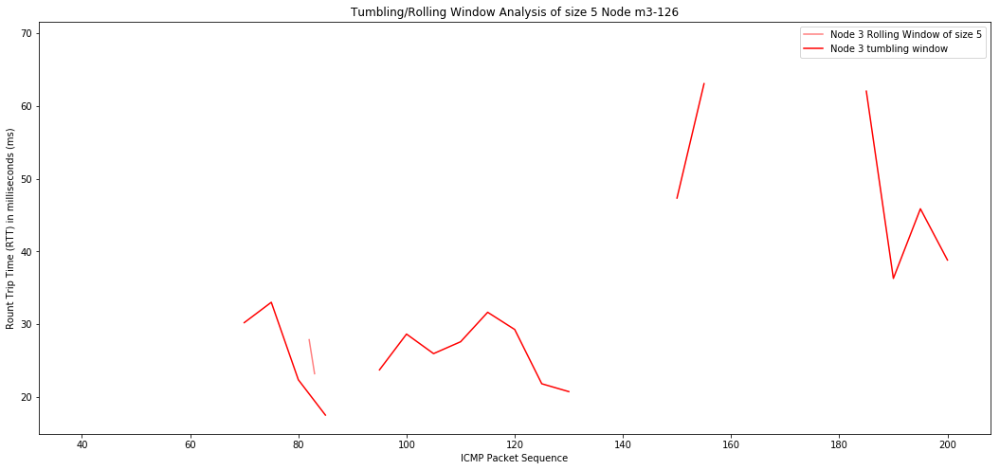

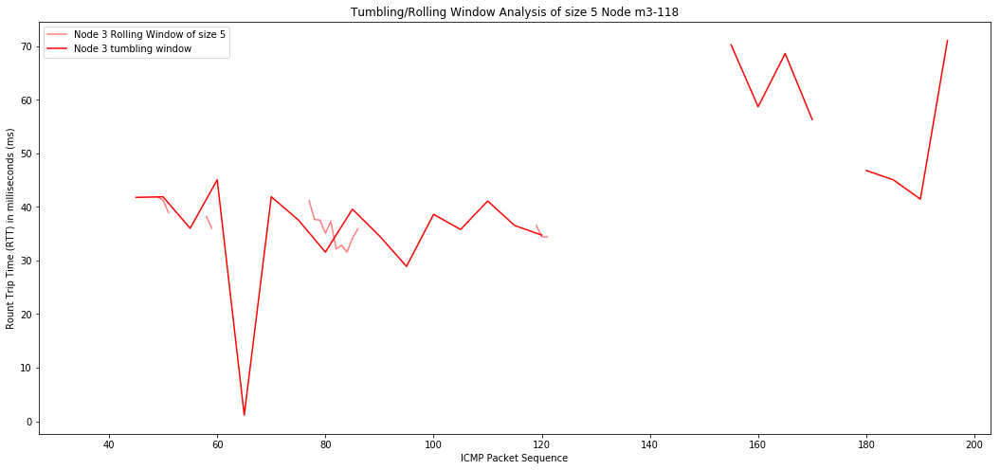

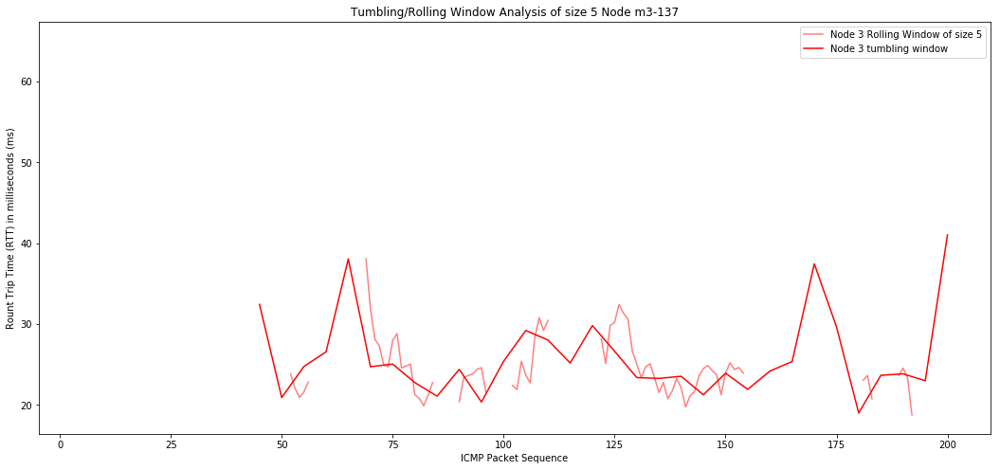

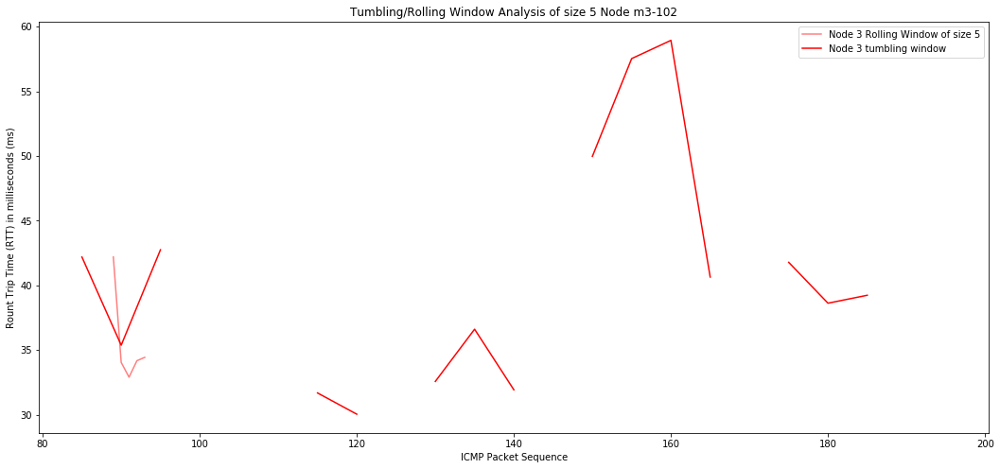

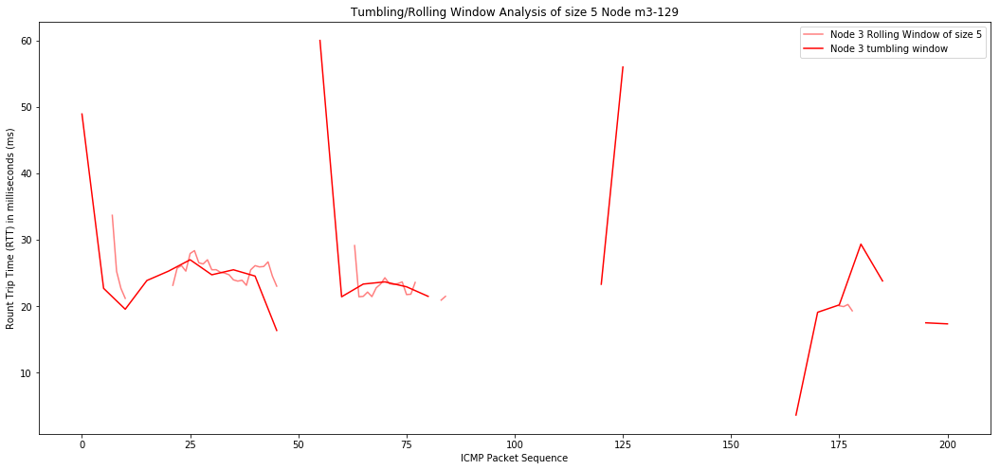

...

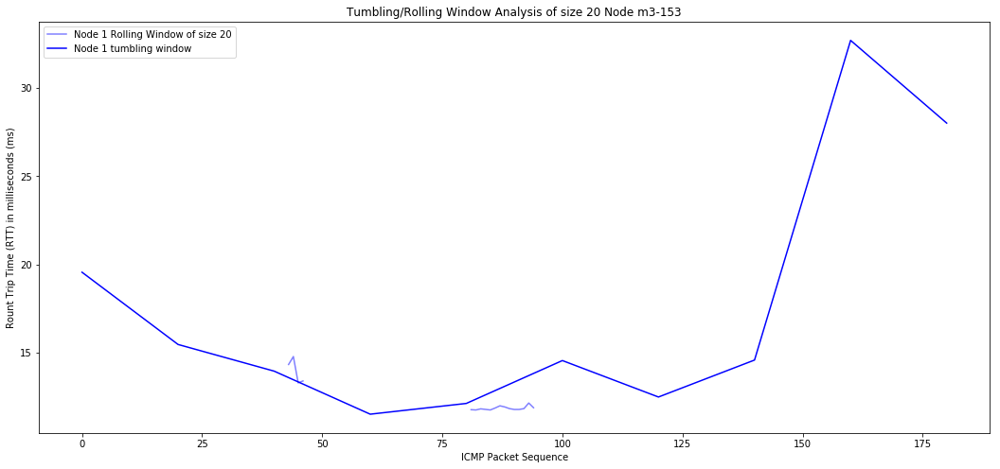

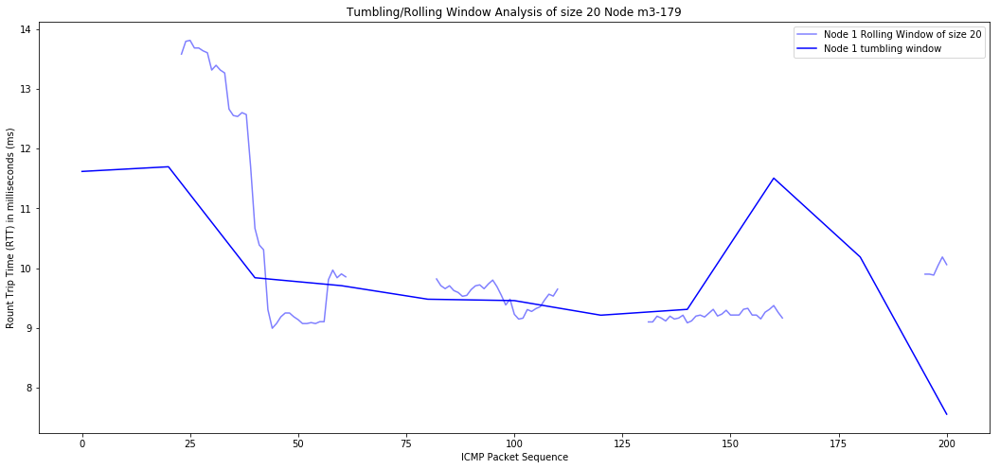

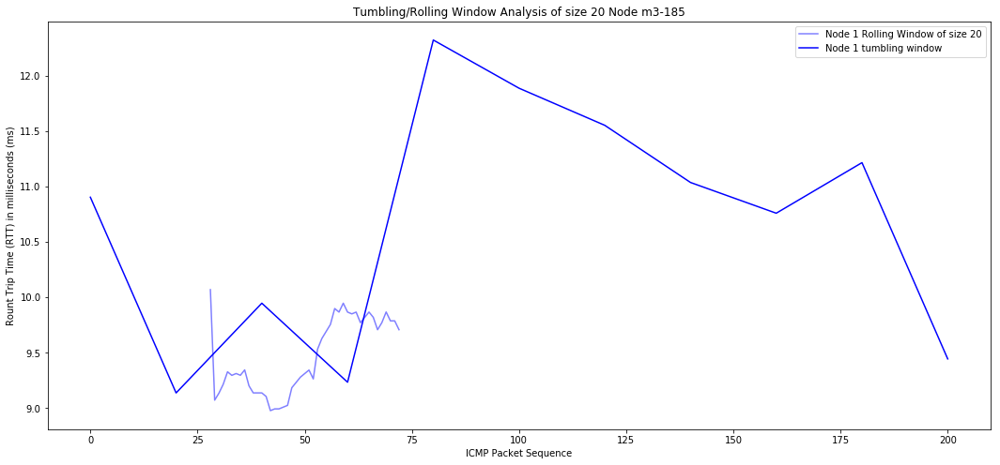

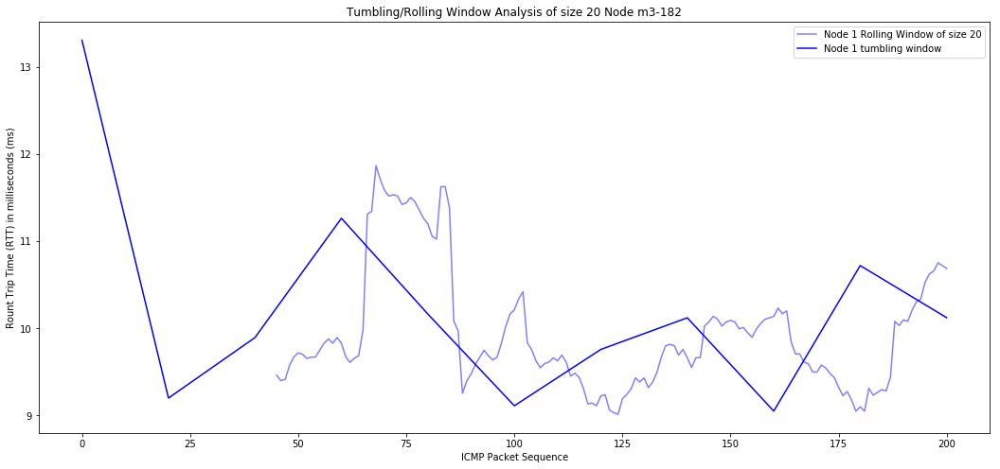

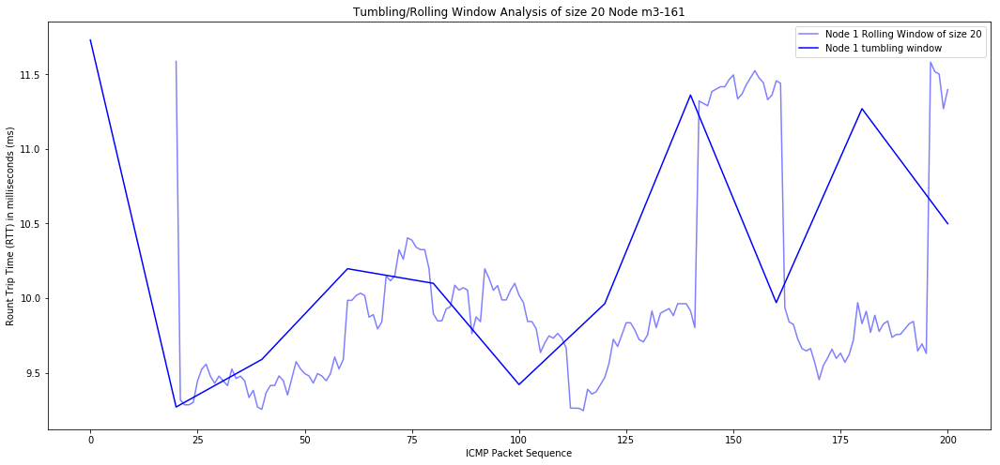

In [13]:
for hop in hops2.keys():
    for window_size in [5, 10, 20]: 
        for node in hops2[hop]:
            fig, ax = plt.subplots(figsize=(18, 8))
            plt.ylabel('Rount Trip Time (RTT) in milliseconds (ms)')
            plt.xlabel('ICMP Packet Sequence')

            plt.plot(nodes2[node].rolling(window_size).mean(), color=color[hop], alpha=0.5, label='Node ' + str(hop) + ' Rolling Window of size ' + str(window_size))
            plt.plot(nodes2[node].groupby(nodes2[node].index // window_size * window_size).mean(), color=color[hop], label='Node ' + str(hop) + ' tumbling window')

            plt.title('Tumbling/Rolling Window Analysis of size ' + str(window_size) + ' Node ' + str(node))
            plt.legend()

../trace_analysis.py:159: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['node_id'] = addr['node_id'].convert_objects(convert_numeric=True)
../trace_analysis.py:175: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['rank'] = rank['rank'].convert_objects(convert_numeric=True)
../trace_analysis.py:190: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rpl['node_id'] = rpl['node_id'].convert_objects(convert_numeric=True)


<Figure size 432x288 with 0 Axes>

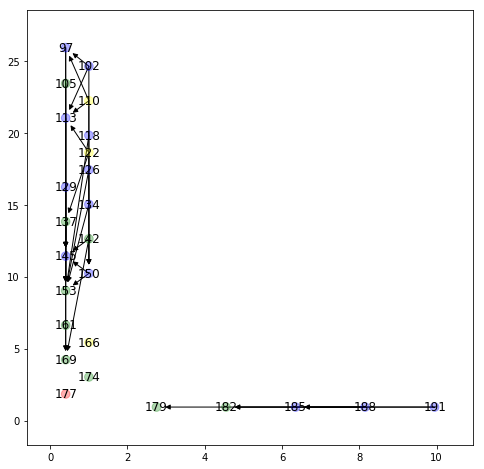

In [14]:
G1b = trace_analysis.produce_iotlab_topology(os.getcwd() + '/traces/', '2019-01JAN-30-1b169')

plt.clf()
fig = plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(G1, pos=nx.get_node_attributes(G1,'loc'), node_shape='.', node_color=list(nx.get_node_attributes(G1,'color').values()), alpha=0.3)
nx.draw_networkx_labels(G1, pos=nx.get_node_attributes(G1,'loc'), labels=nx.get_node_attributes(G1,'id'))
nx.draw_networkx_edges(G1, pos=nx.get_node_attributes(G1,'loc'))
plt.show()

## Additional 2 node disconnections
Parse the 3rd trace file with 200 packets over a network with 2 additional nodes are disconnected. Now a total of 3 nodes are offline (node 153,169,182).

In [15]:
nodes3, hops3 = trace_analysis.process_iotlab_node_by_node(os.getcwd() + '/traces/', '2019-01JAN-30-1b169b153b182')
std_values3, outliers3 = trace_analysis.separate_outliers_node_by_node(nodes3)

../trace_analysis.py:248: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rank['rank'] = rank['rank'].convert_objects(convert_numeric=True)


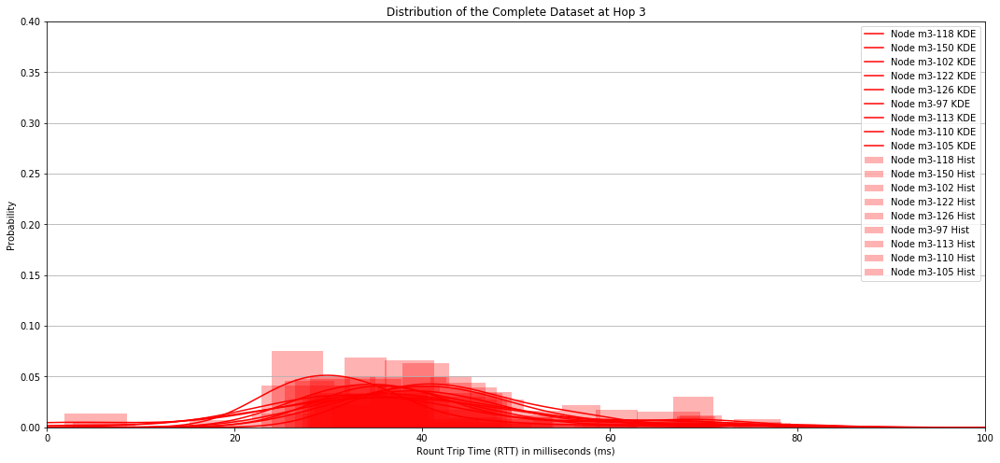

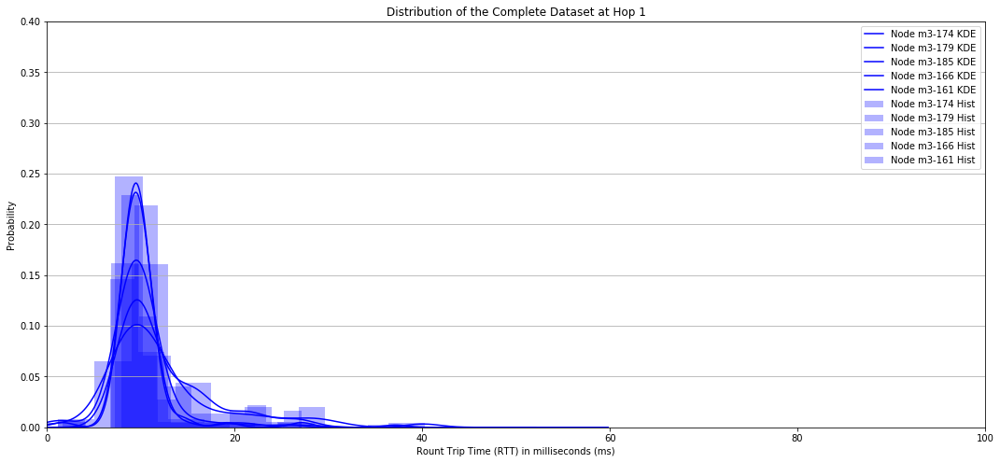

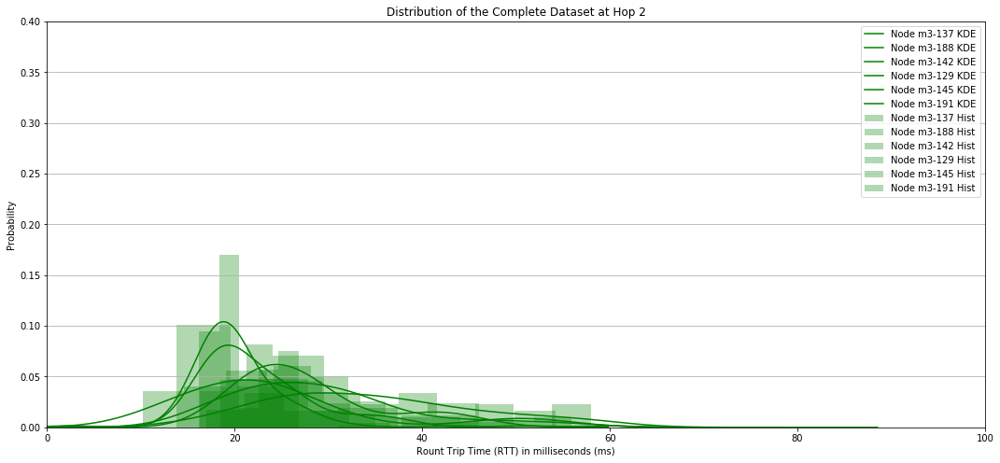

In [16]:
for hop in hops3.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops3[hop]:
        nodes3[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        nodes3[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Complete Dataset at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

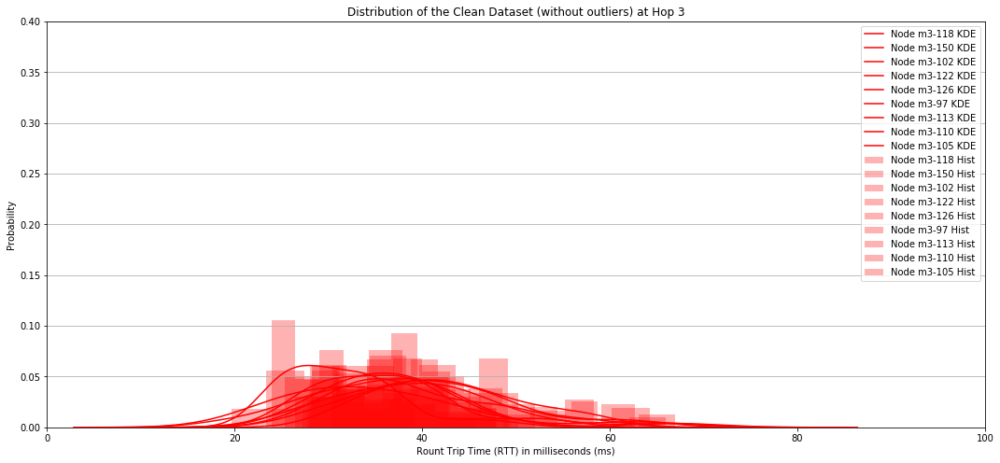

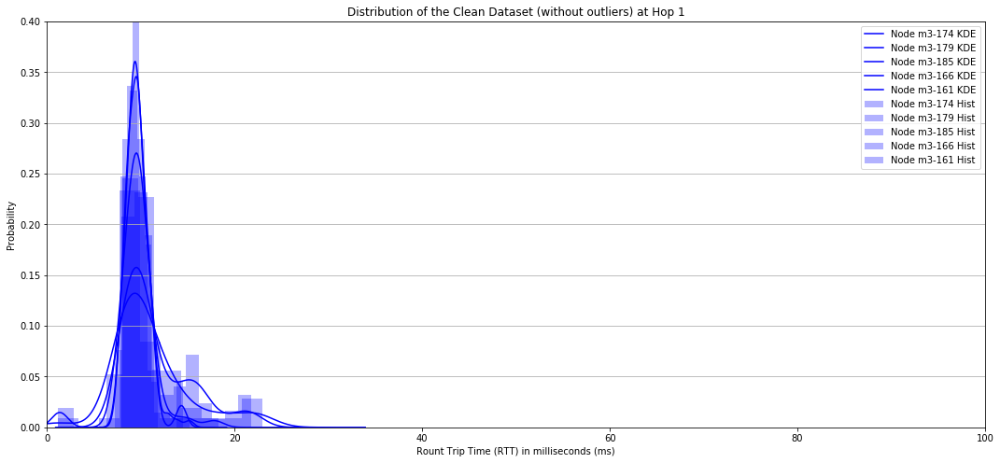

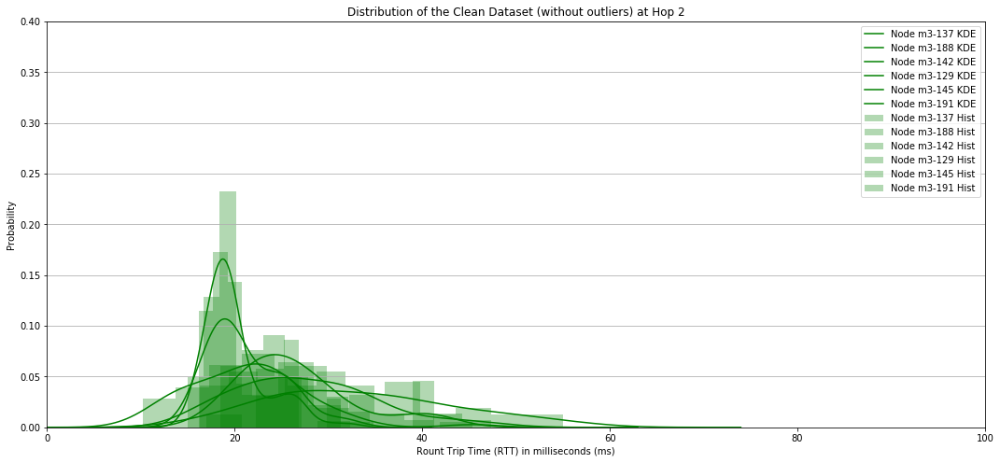

In [17]:
for hop in hops3.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops3[hop]:
        std_values3[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        std_values3[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Clean Dataset (without outliers) at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

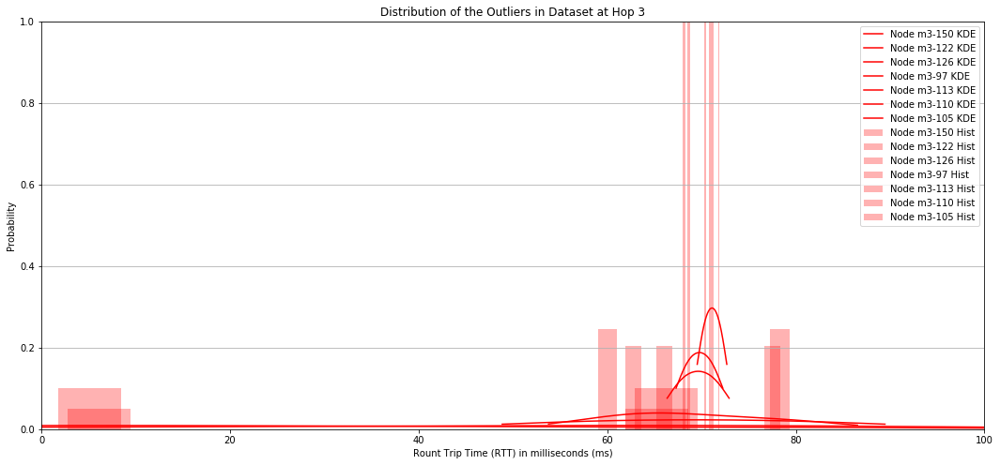

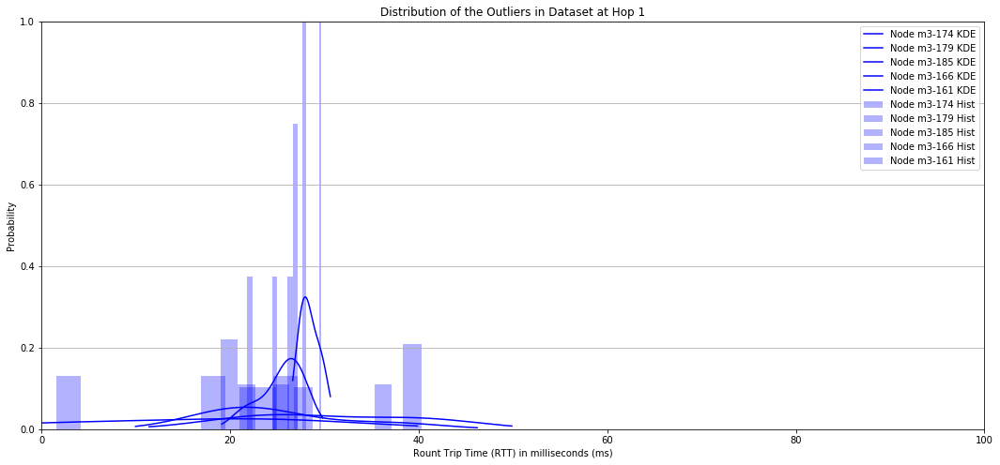

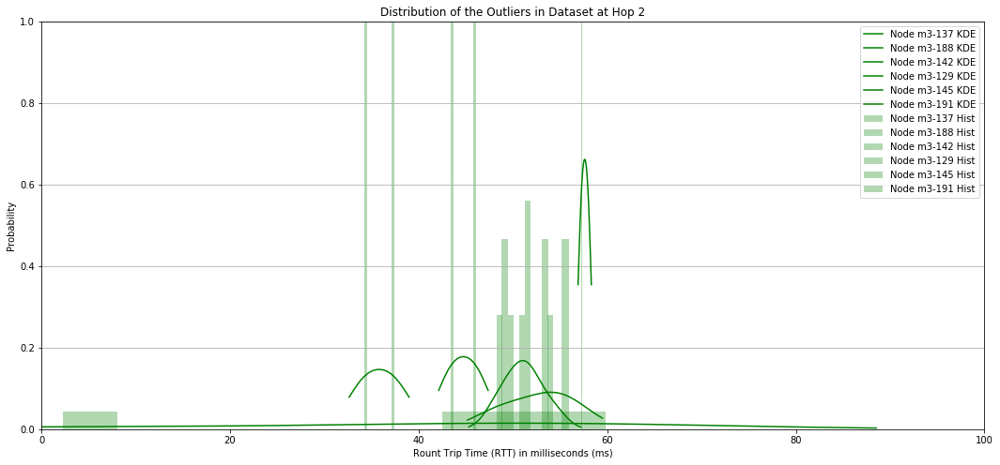

In [18]:
for hop in hops3.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops3[hop]:
        if len(outliers3[node].dropna()) > 1:
            outliers3[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
            outliers3[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Outliers in Dataset at Hop ' +str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,1])
    ax.legend()
    plt.show()

Produce a visualization of a tumbling window

/Users/lucamaiano/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


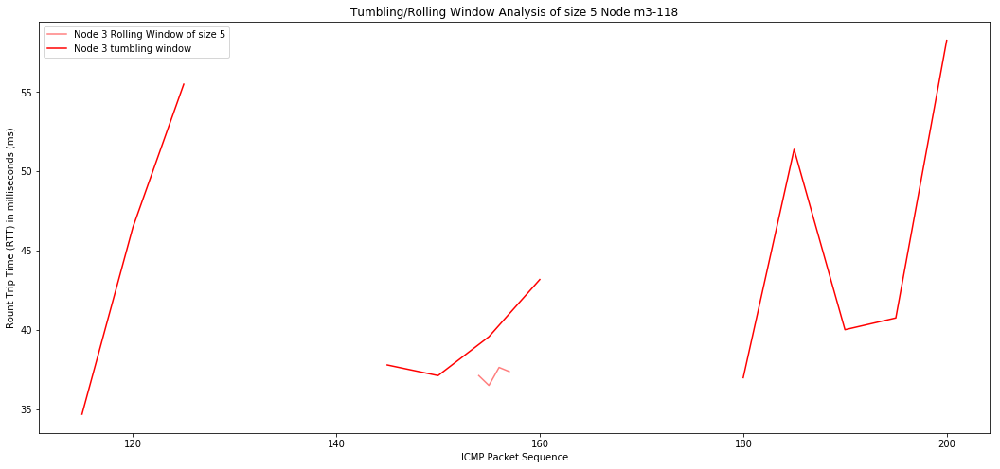

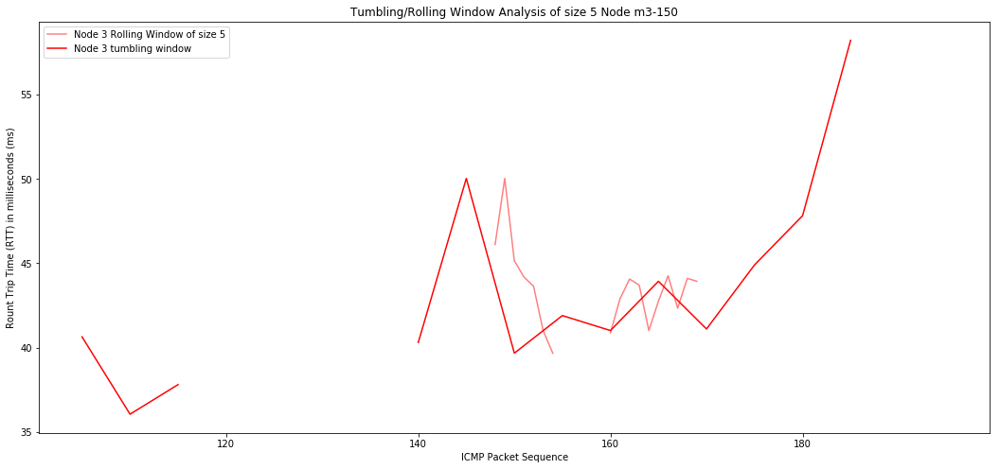

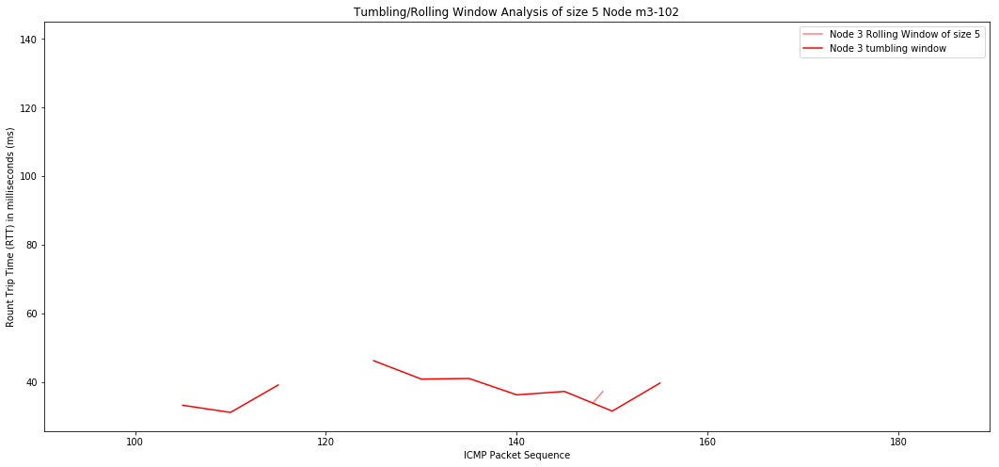

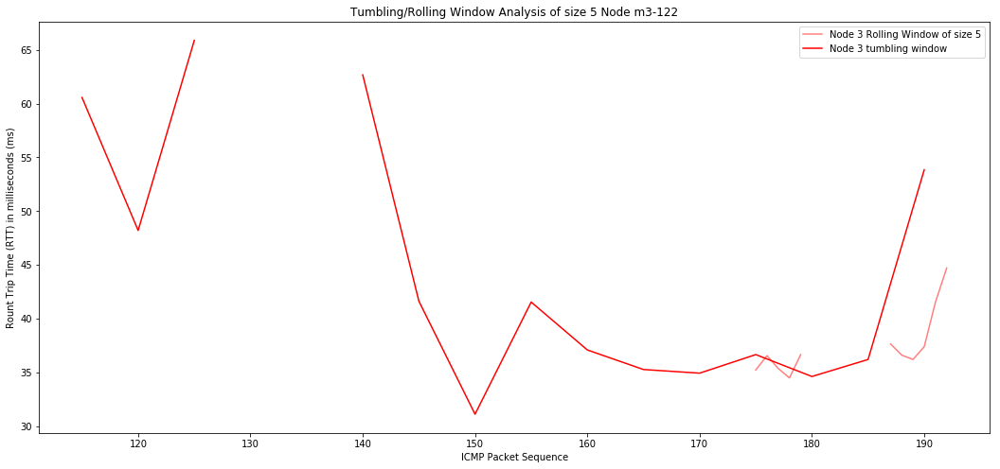

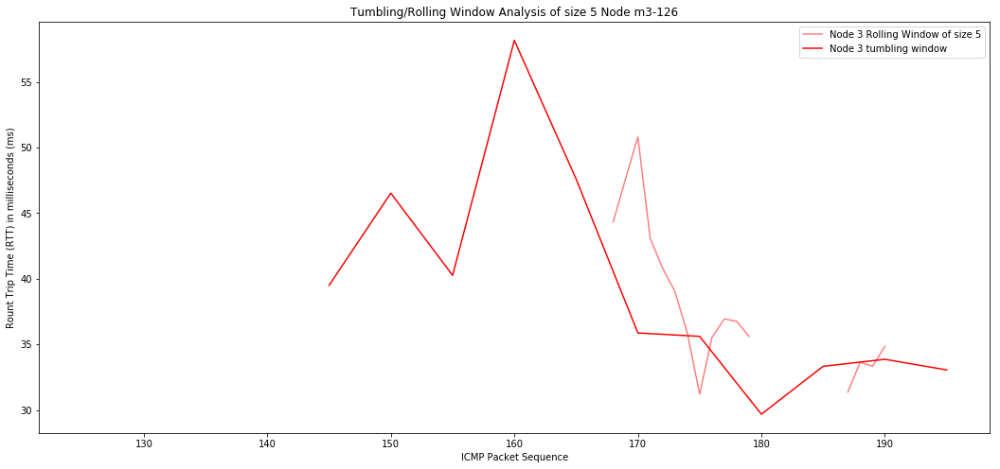

...

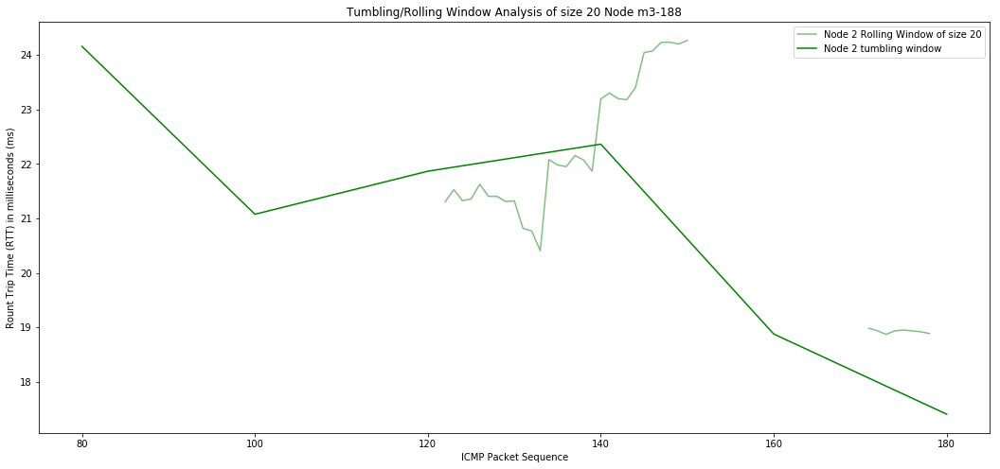

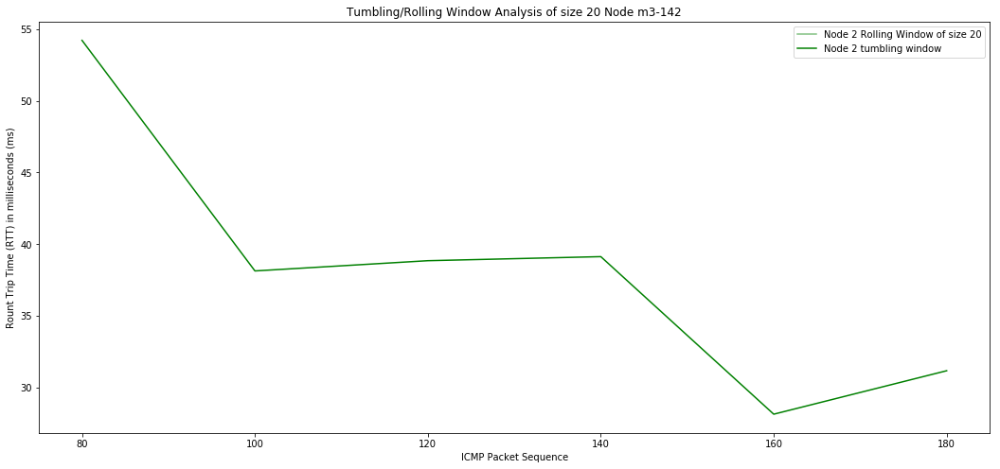

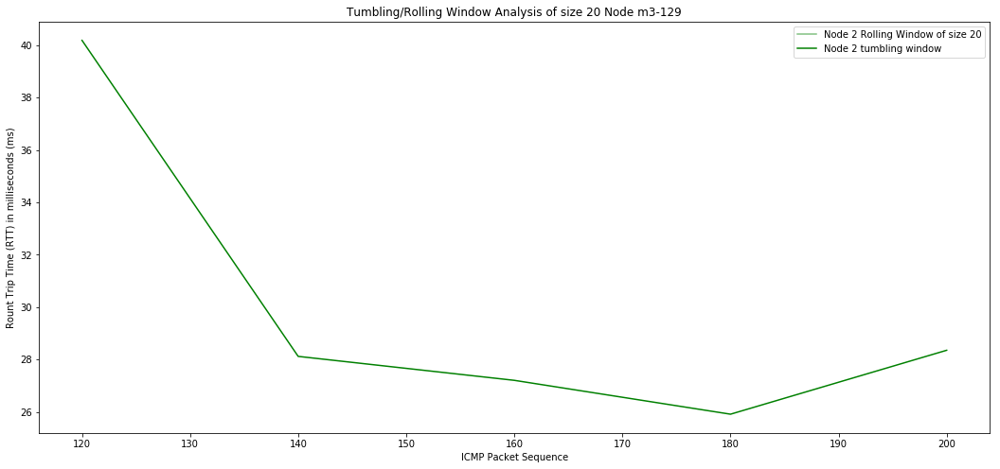

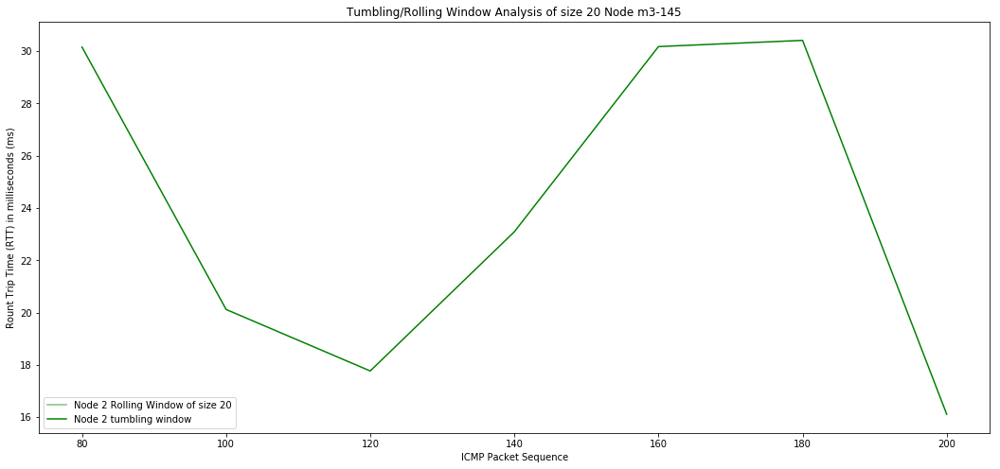

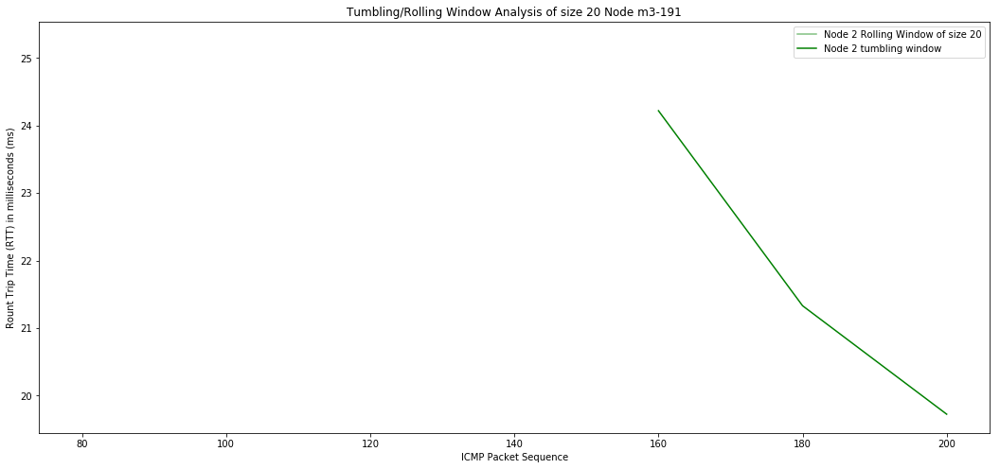

In [19]:
for hop in hops3.keys():
    for window_size in [5, 10, 20]: 
        for node in hops3[hop]:
            fig, ax = plt.subplots(figsize=(18, 8))
            plt.ylabel('Rount Trip Time (RTT) in milliseconds (ms)')
            plt.xlabel('ICMP Packet Sequence')

            plt.plot(nodes3[node].rolling(window_size).mean(), color=color[hop], alpha=0.5, label='Node ' + str(hop) + ' Rolling Window of size ' + str(window_size))
            plt.plot(nodes3[node].groupby(nodes3[node].index // window_size * window_size).mean(), color=color[hop], label='Node ' + str(hop) + ' tumbling window')

            plt.title('Tumbling/Rolling Window Analysis of size ' + str(window_size) + ' Node ' + str(node))
            plt.legend()

Visualize network topology

../trace_analysis.py:159: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['node_id'] = addr['node_id'].convert_objects(convert_numeric=True)
../trace_analysis.py:175: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['rank'] = rank['rank'].convert_objects(convert_numeric=True)
../trace_analysis.py:190: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rpl['node_id'] = rpl['node_id'].convert_objects(convert_numeric=True)


<Figure size 432x288 with 0 Axes>

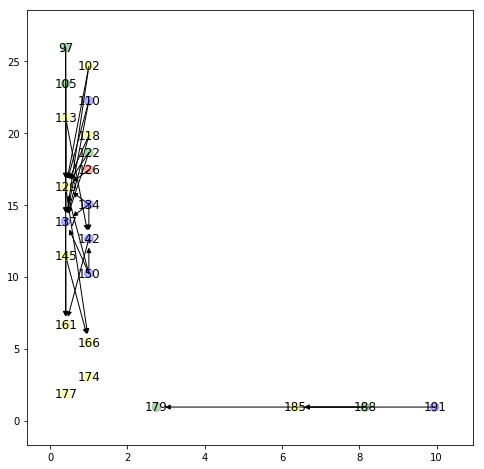

In [20]:
G3 = trace_analysis.produce_iotlab_topology(os.getcwd() + '/traces/', '2019-01JAN-30-1b169b153b182')

plt.clf()
fig = plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(G3, pos=nx.get_node_attributes(G3,'loc'), node_shape='.', node_color=list(nx.get_node_attributes(G3,'color').values()), alpha=0.3)
nx.draw_networkx_labels(G3, pos=nx.get_node_attributes(G3,'loc'), labels=nx.get_node_attributes(G3,'id'))
nx.draw_networkx_edges(G3, pos=nx.get_node_attributes(G3,'loc'))
plt.show()

## Nodes are re-activated
Parse the 4th trace file with 200 packets when 3 nodes (153,169,182) are re-activated.

In [21]:
nodes4, hops4 = trace_analysis.process_iotlab_node_by_node(os.getcwd() + '/traces/', '2019-01JAN-30-2')
std_values4, outliers4 = trace_analysis.separate_outliers_node_by_node(nodes4)

../trace_analysis.py:248: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rank['rank'] = rank['rank'].convert_objects(convert_numeric=True)


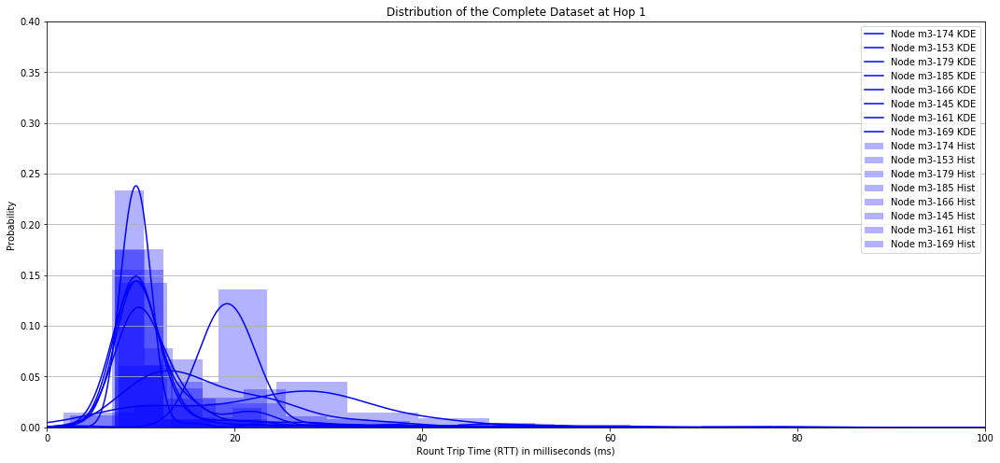

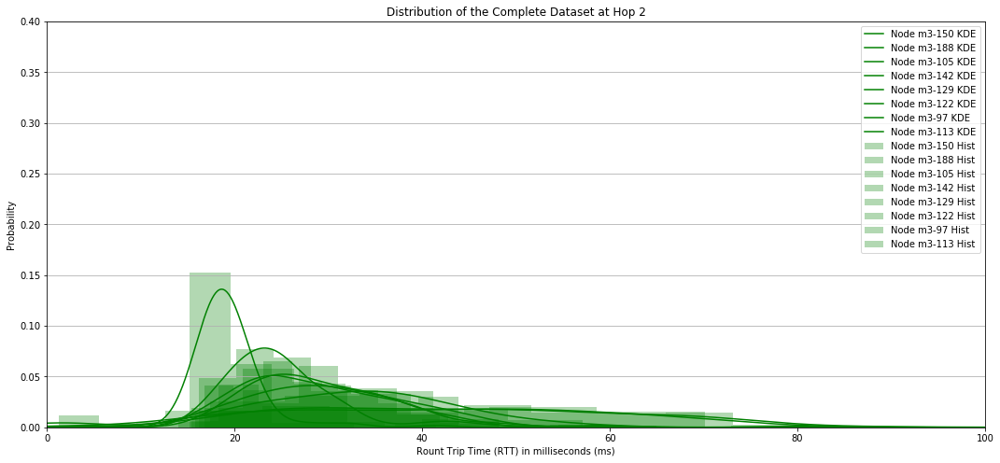

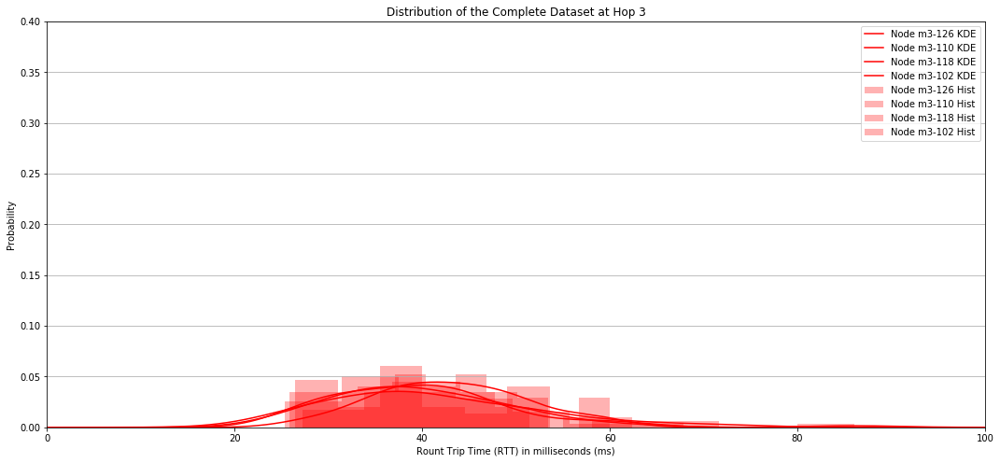

In [22]:
for hop in hops4.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops4[hop]:
        nodes4[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        nodes4[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Complete Dataset at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

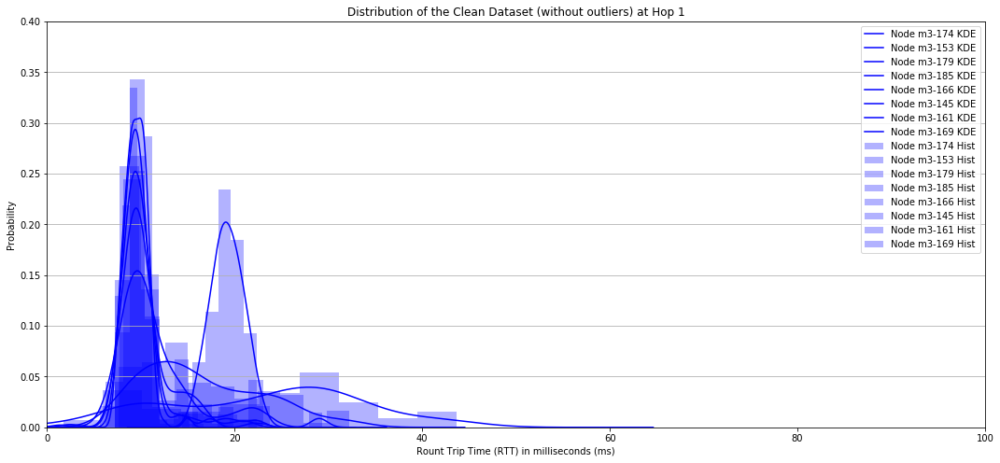

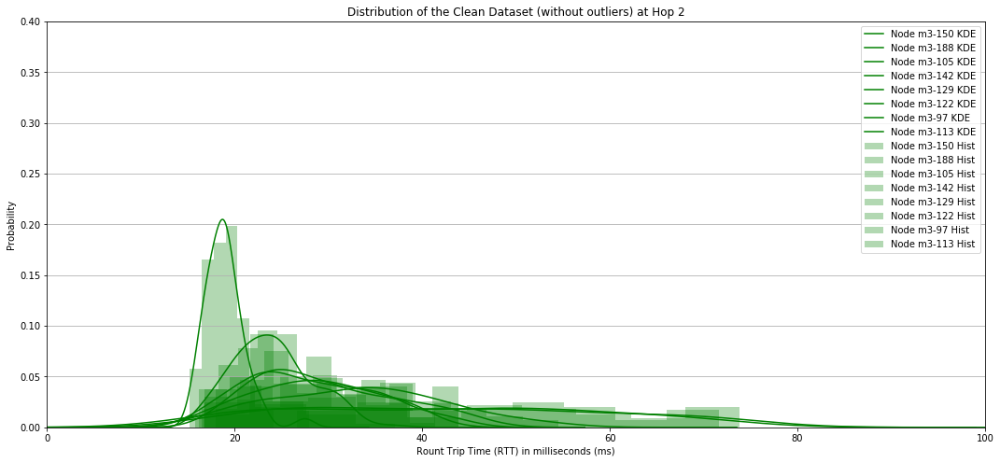

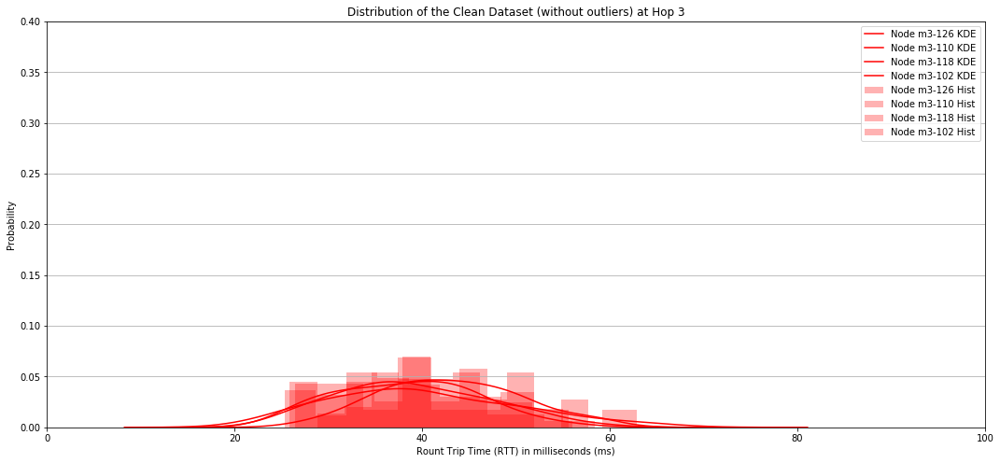

In [23]:
for hop in hops4.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops4[hop]:
        std_values4[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        std_values4[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Clean Dataset (without outliers) at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

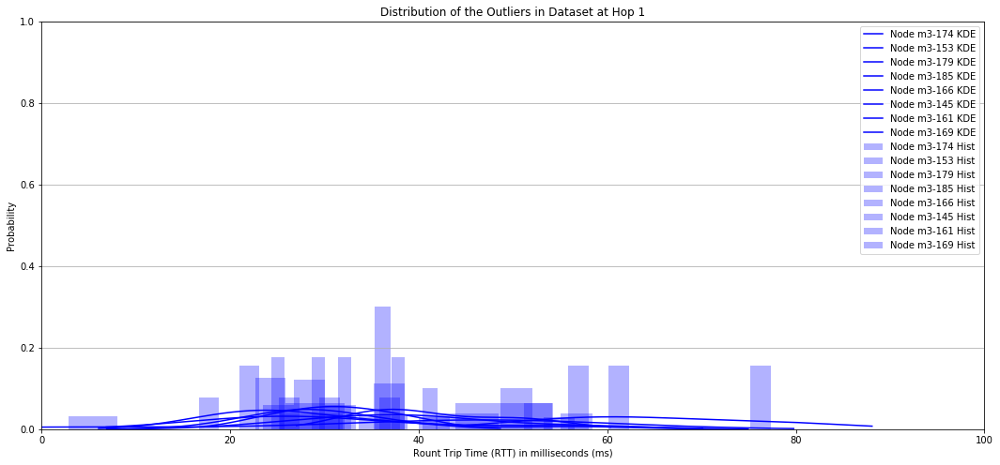

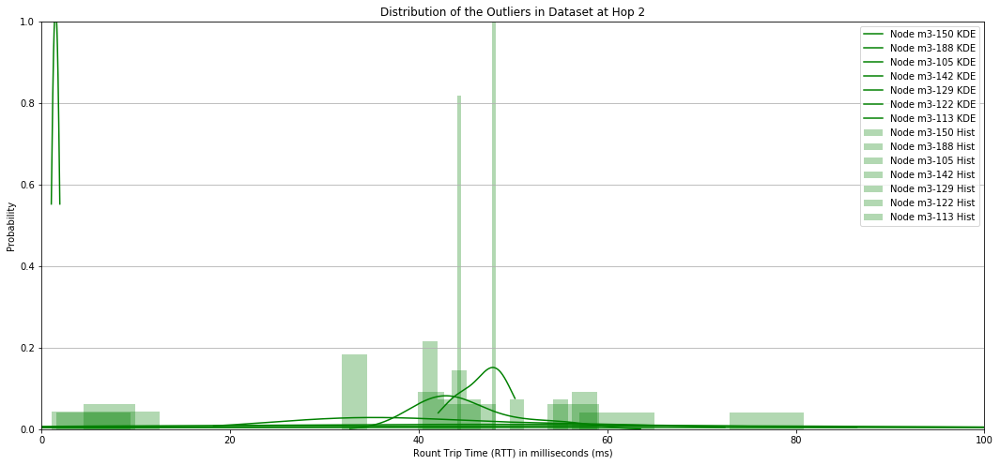

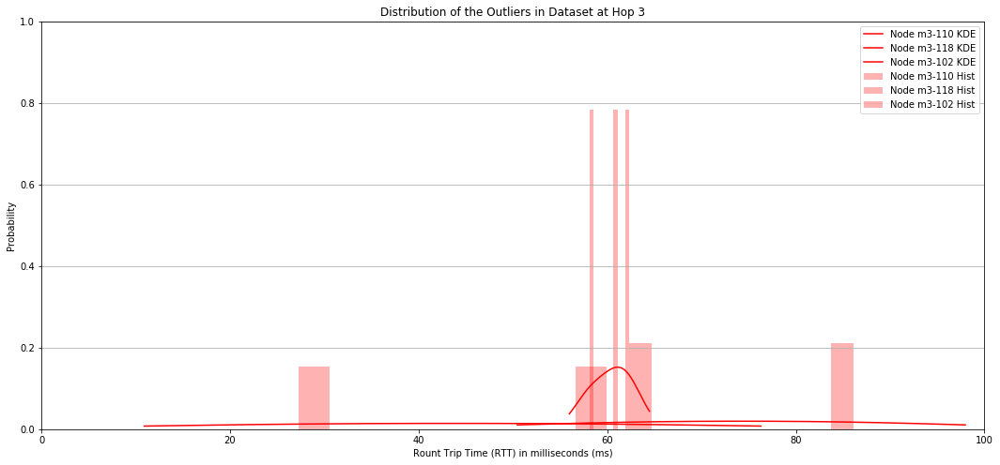

In [24]:
for hop in hops4.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops4[hop]:
        if len(outliers4[node].dropna()) > 1:
            outliers4[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
            outliers4[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Outliers in Dataset at Hop ' +str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,1])
    ax.legend()
    plt.show()

Produce a visualization of a tumbling window

/Users/lucamaiano/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


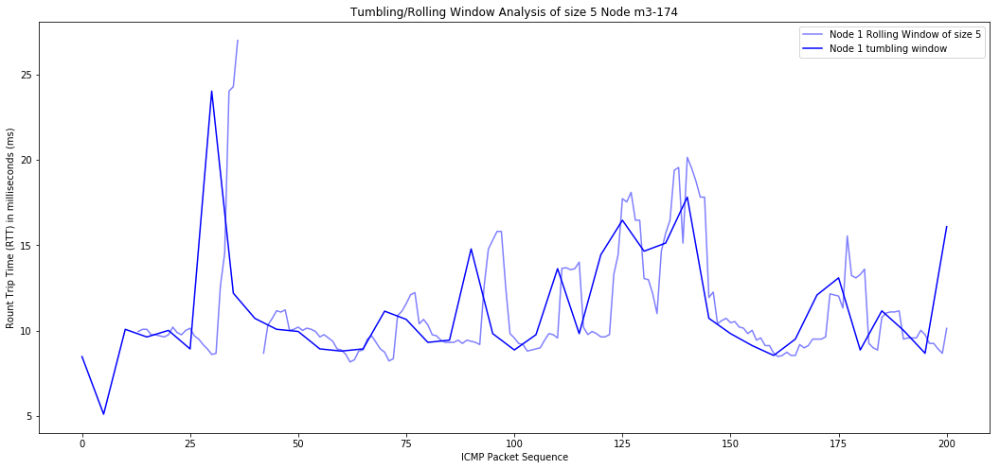

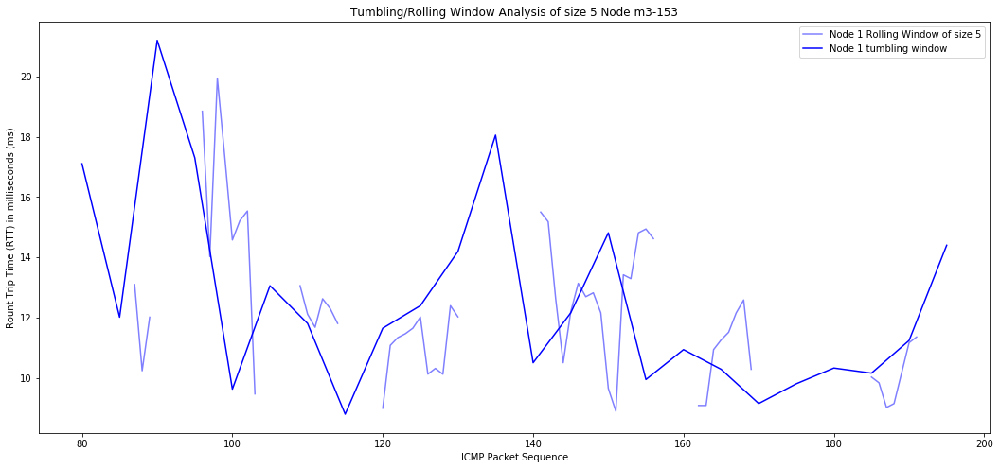

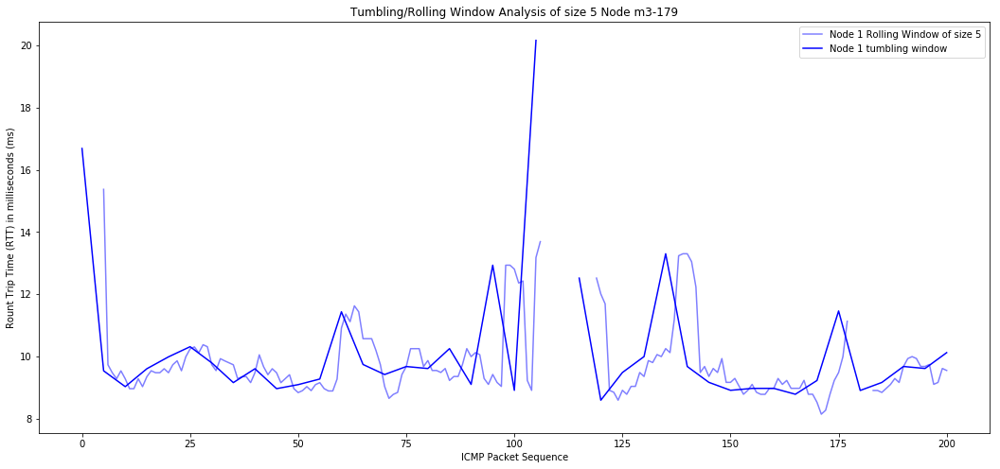

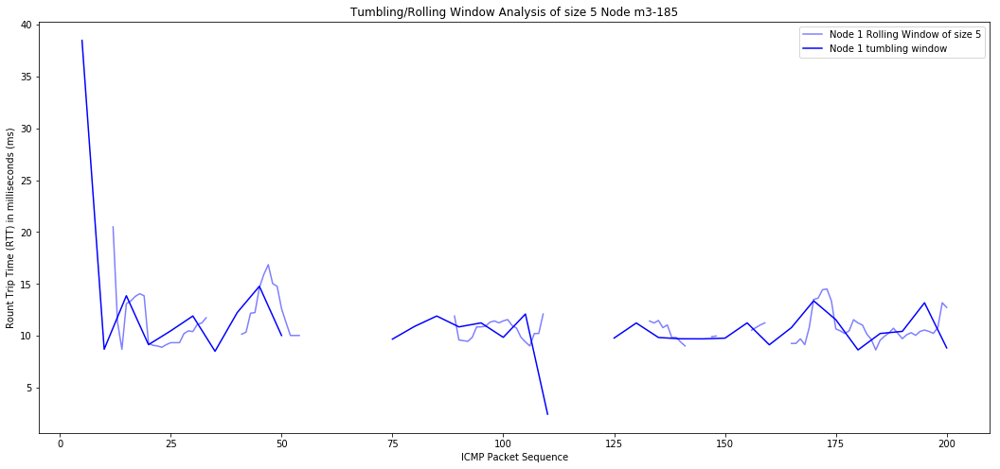

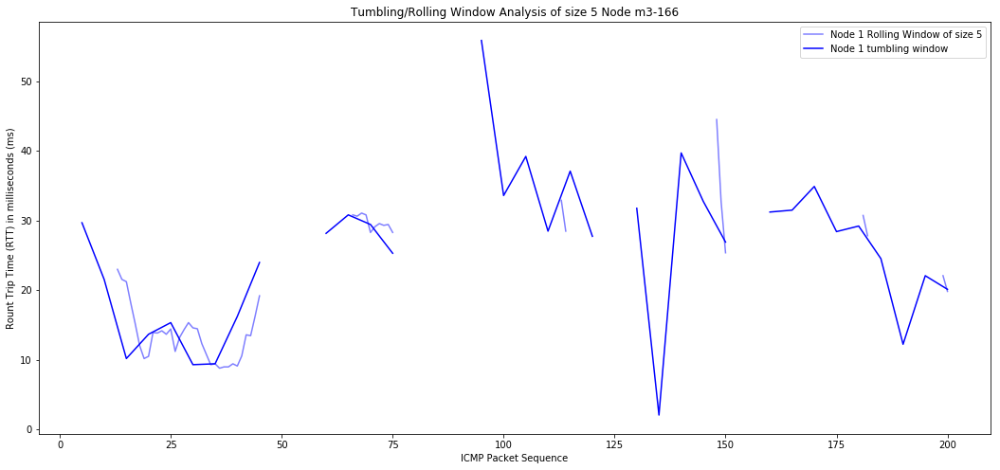

...

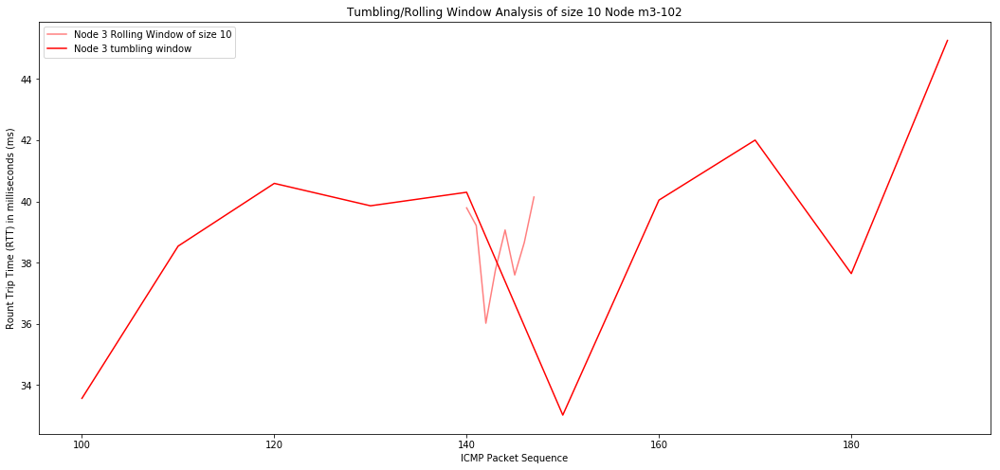

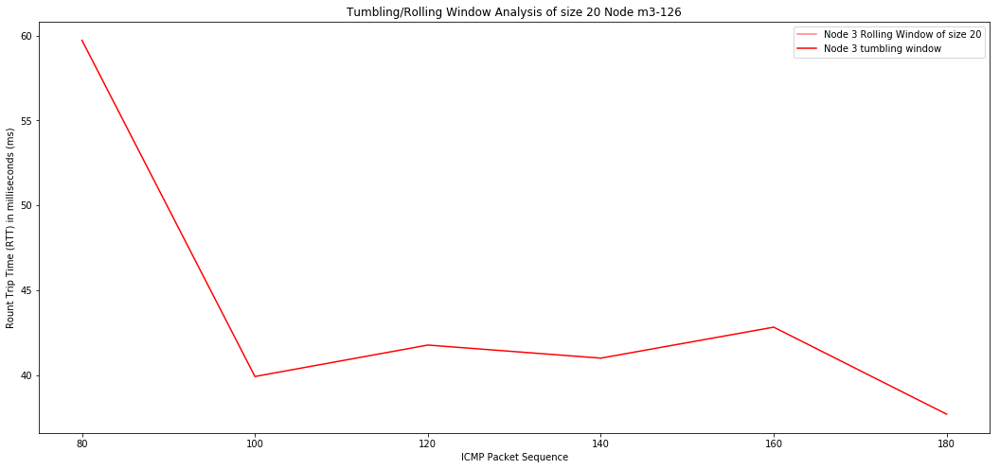

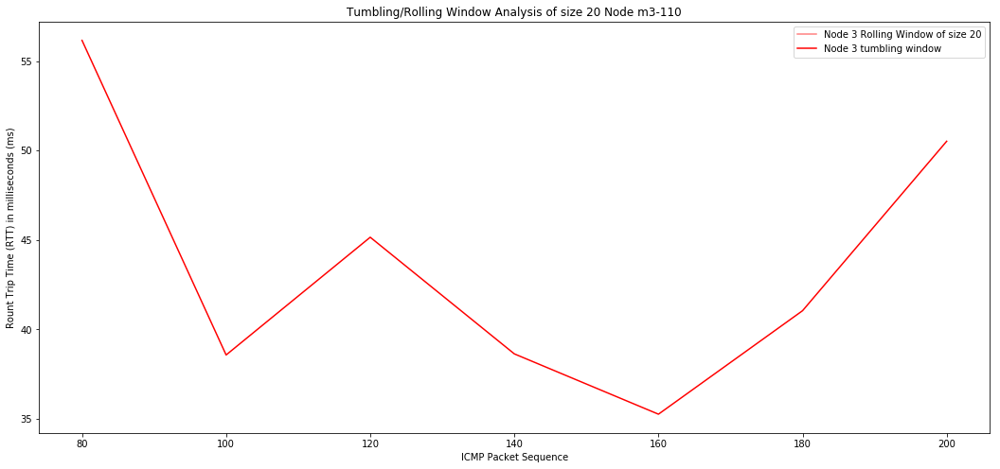

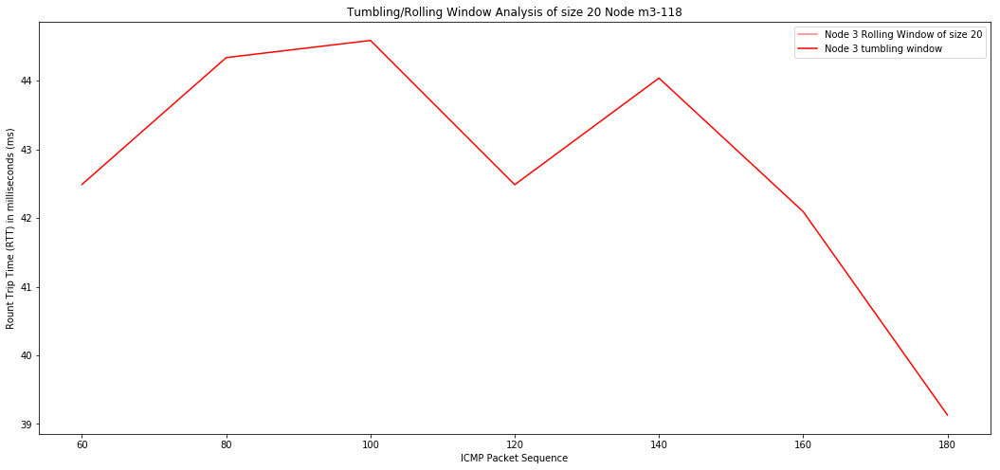

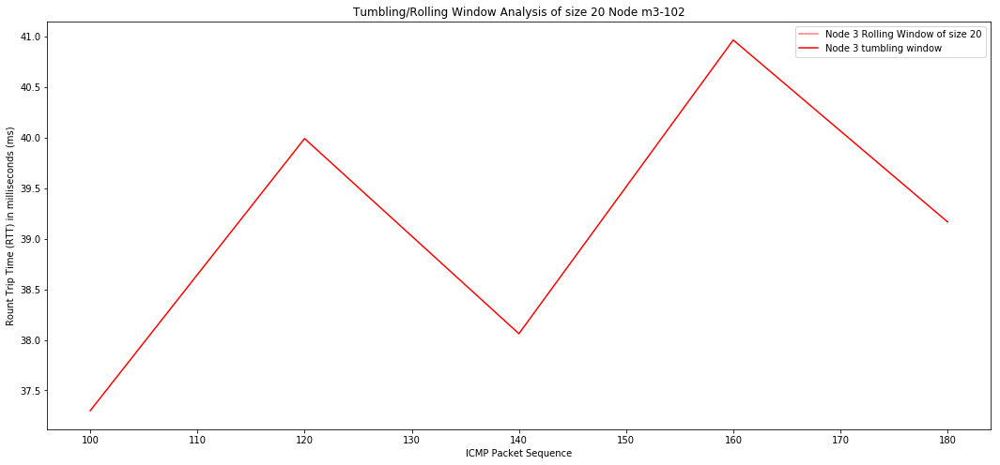

In [25]:
for hop in hops4.keys():
    for window_size in [5, 10, 20]: 
        for node in hops4[hop]:
            fig, ax = plt.subplots(figsize=(18, 8))
            plt.ylabel('Rount Trip Time (RTT) in milliseconds (ms)')
            plt.xlabel('ICMP Packet Sequence')

            plt.plot(nodes4[node].rolling(window_size).mean(), color=color[hop], alpha=0.5, label='Node ' + str(hop) + ' Rolling Window of size ' + str(window_size))
            plt.plot(nodes4[node].groupby(nodes4[node].index // window_size * window_size).mean(), color=color[hop], label='Node ' + str(hop) + ' tumbling window')

            plt.title('Tumbling/Rolling Window Analysis of size ' + str(window_size) + ' Node ' + str(node))
            plt.legend()

Visualize network topology

../trace_analysis.py:159: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['node_id'] = addr['node_id'].convert_objects(convert_numeric=True)
../trace_analysis.py:175: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['rank'] = rank['rank'].convert_objects(convert_numeric=True)
../trace_analysis.py:190: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rpl['node_id'] = rpl['node_id'].convert_objects(convert_numeric=True)


<Figure size 432x288 with 0 Axes>

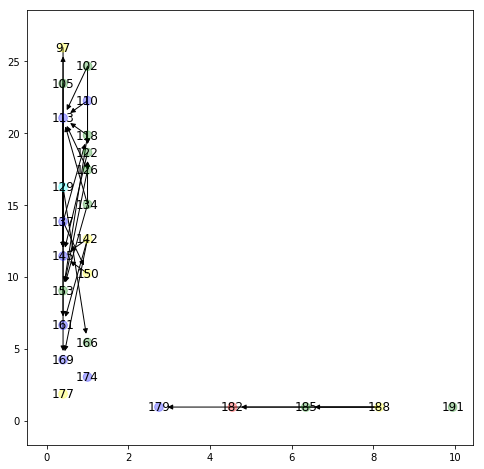

In [26]:
G4 = trace_analysis.produce_iotlab_topology(os.getcwd() + '/traces/', '2019-01JAN-30-2')

plt.clf()
fig = plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(G4, pos=nx.get_node_attributes(G4,'loc'), node_shape='.', node_color=list(nx.get_node_attributes(G4,'color').values()), alpha=0.3)
nx.draw_networkx_labels(G4, pos=nx.get_node_attributes(G4,'loc'), labels=nx.get_node_attributes(G4,'id'))
nx.draw_networkx_edges(G4, pos=nx.get_node_attributes(G4,'loc'))
plt.show()

## 5 Nodes are de-activated
Parse the 5th trace file with 200 packets when 5 nodes (113,122,145,166,185) are de-activated.

In [27]:
nodes5, hops5 = trace_analysis.process_iotlab_node_by_node(os.getcwd() + '/traces/', '2019-01JAN-30-3b113b122b145b166b185')
std_values5, outliers5 = trace_analysis.separate_outliers_node_by_node(nodes5)

../trace_analysis.py:248: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rank['rank'] = rank['rank'].convert_objects(convert_numeric=True)


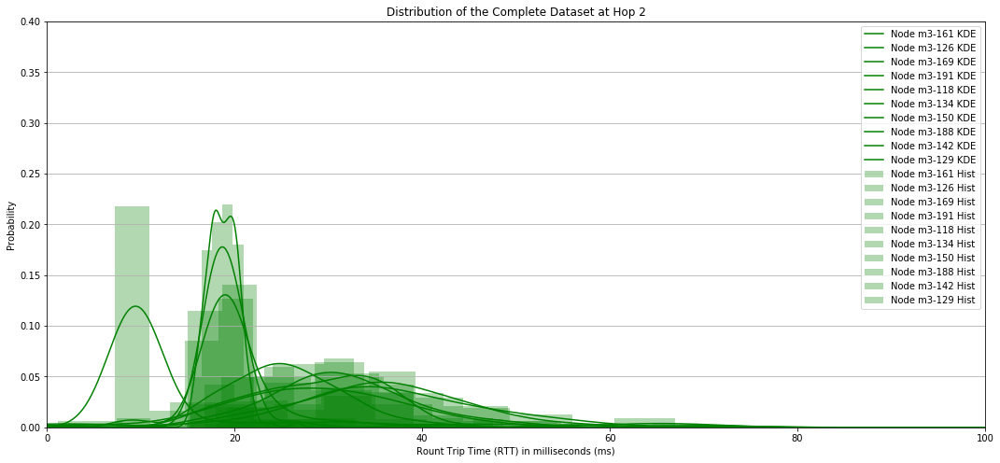

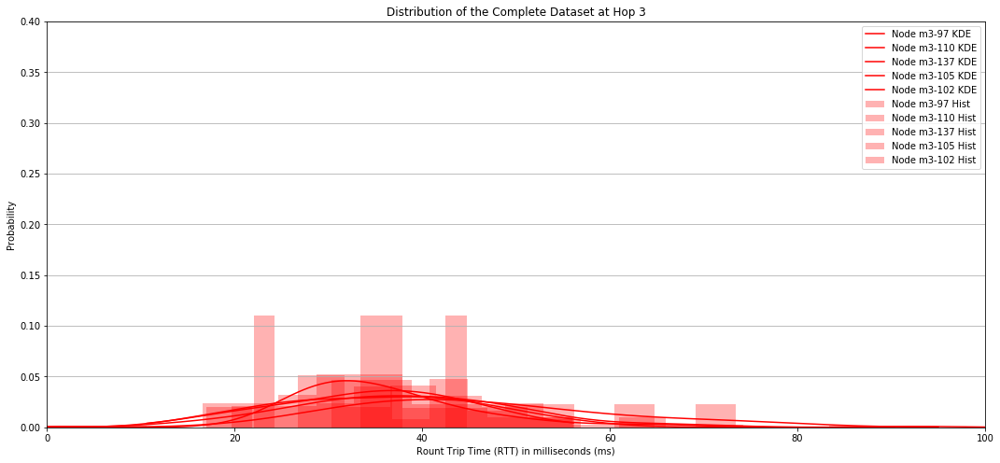

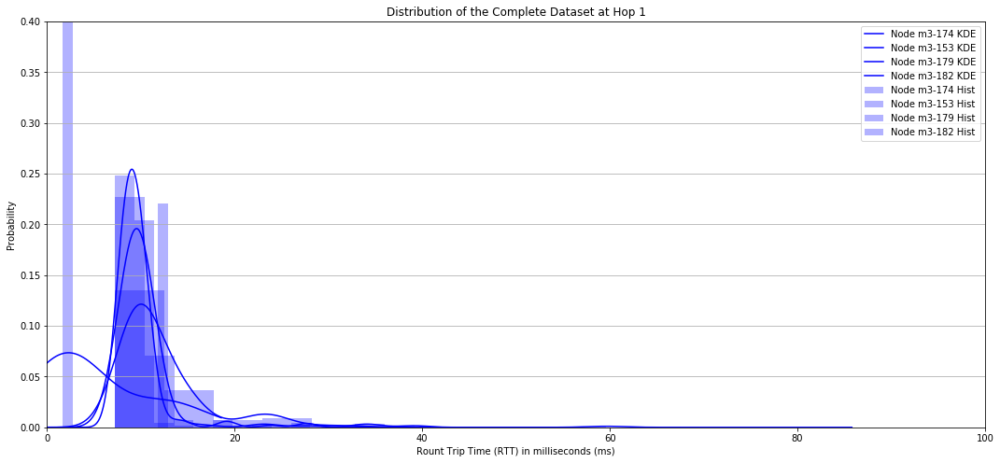

In [28]:
for hop in hops5.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops5[hop]:
        nodes5[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        nodes5[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Complete Dataset at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

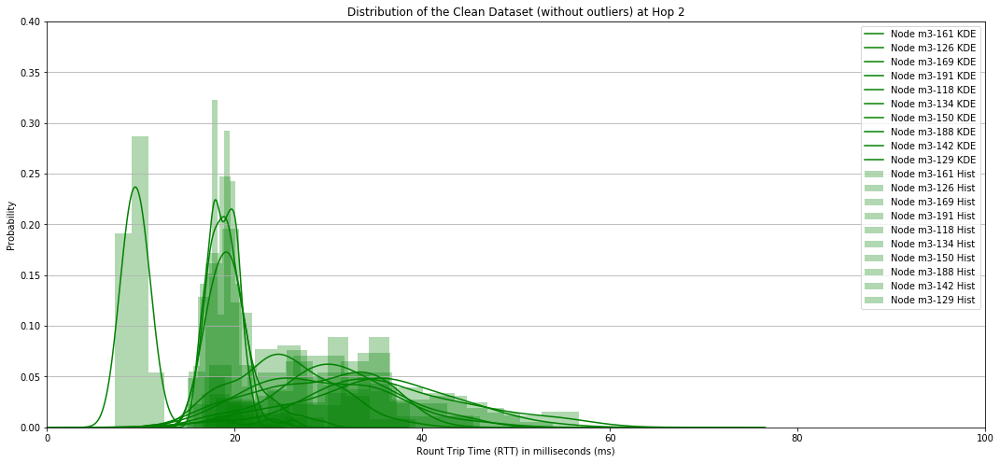

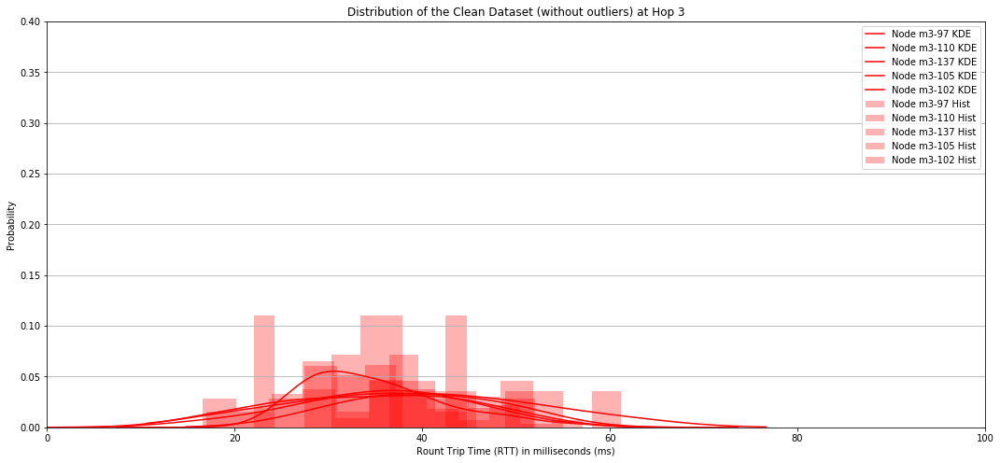

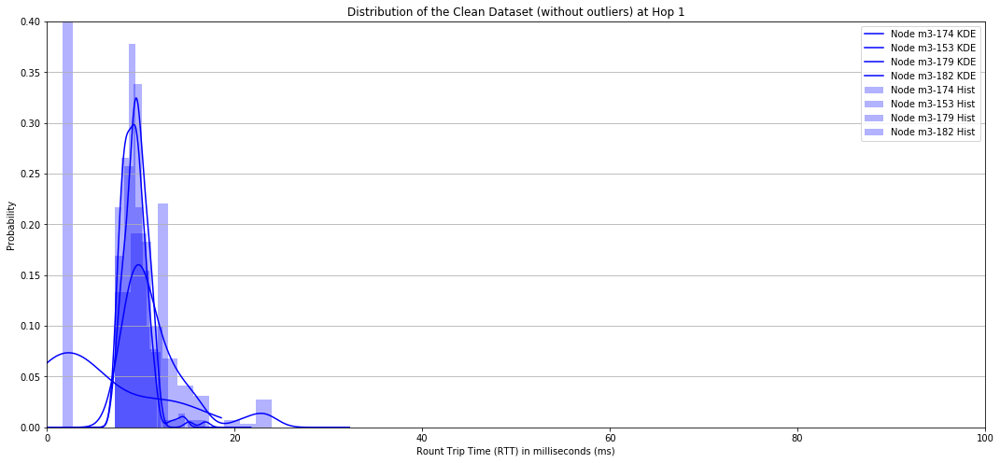

In [29]:
for hop in hops5.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops5[hop]:
        std_values5[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
        std_values5[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Clean Dataset (without outliers) at Hop ' + str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,0.4])
    ax.legend()
    plt.show()

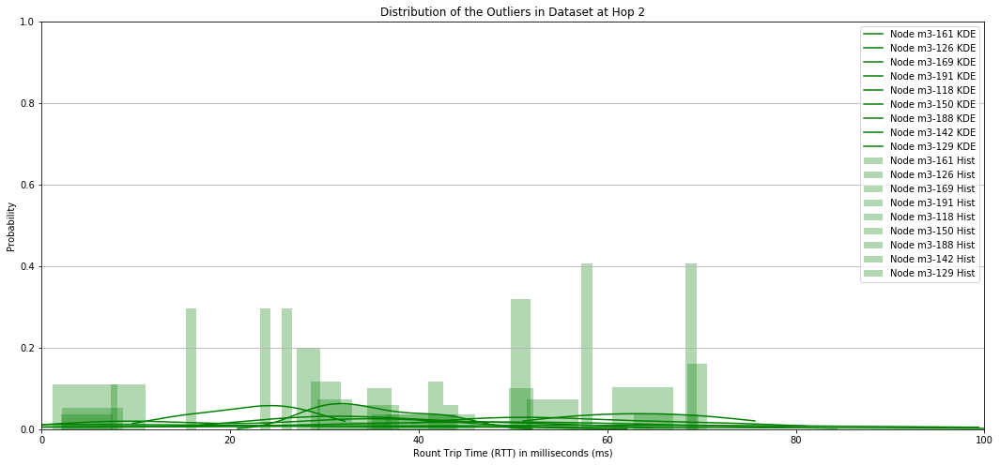

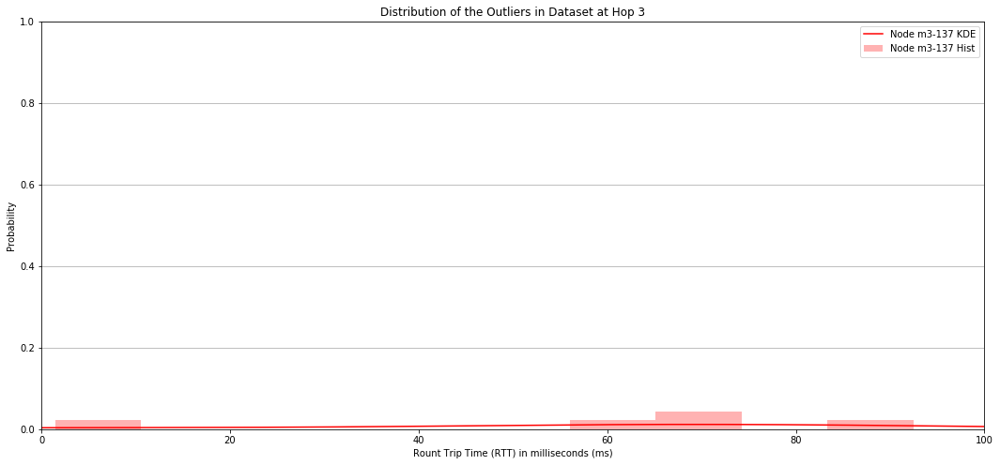

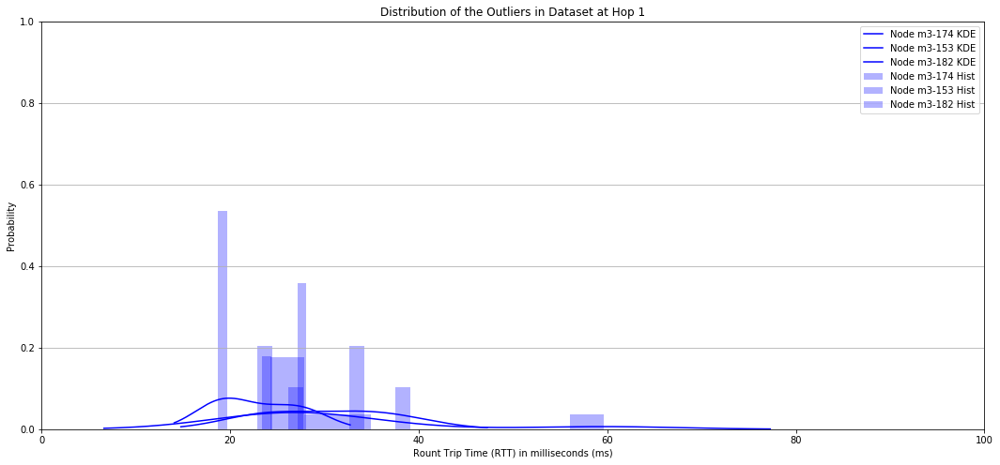

In [30]:
for hop in hops5.keys():
    fig, ax = plt.subplots(figsize=(18, 8))
    
    for node in hops5[hop]:
        if len(outliers5[node].dropna()) > 1:
            outliers5[node].plot.kde(ax=ax, color=color[hop], label='Node ' + str(node) + ' KDE')
            outliers5[node].plot.hist(density=True, color=color[hop], alpha=0.3, ax=ax, label='Node ' + str(node) + ' Hist')

    ax.set_ylabel('Probability')
    ax.set_xlabel('Rount Trip Time (RTT) in milliseconds (ms)')
    ax.grid(axis='y')
    ax.set_title('Distribution of the Outliers in Dataset at Hop ' +str(hop))
    ax.set_xlim([0, 100])
    ax.set_ylim([0,1])
    ax.legend()
    plt.show()

Produce a visualization of a tumbling window

/Users/lucamaiano/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


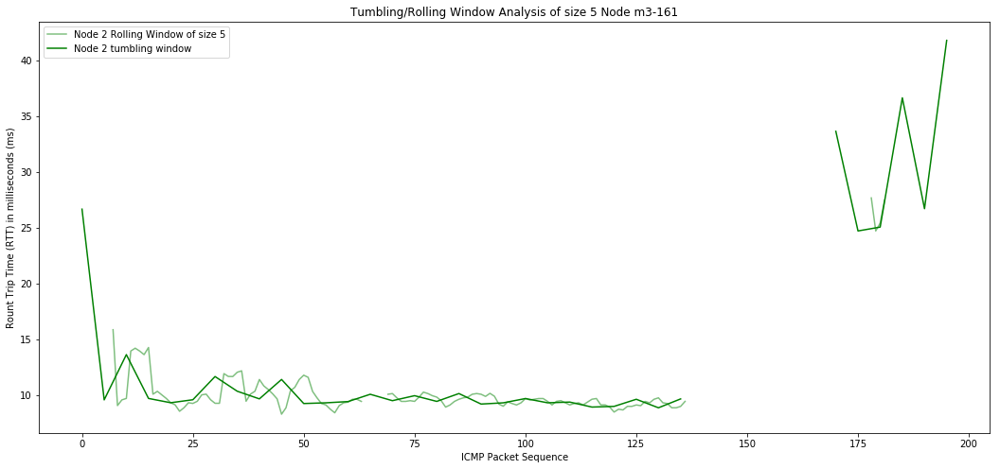

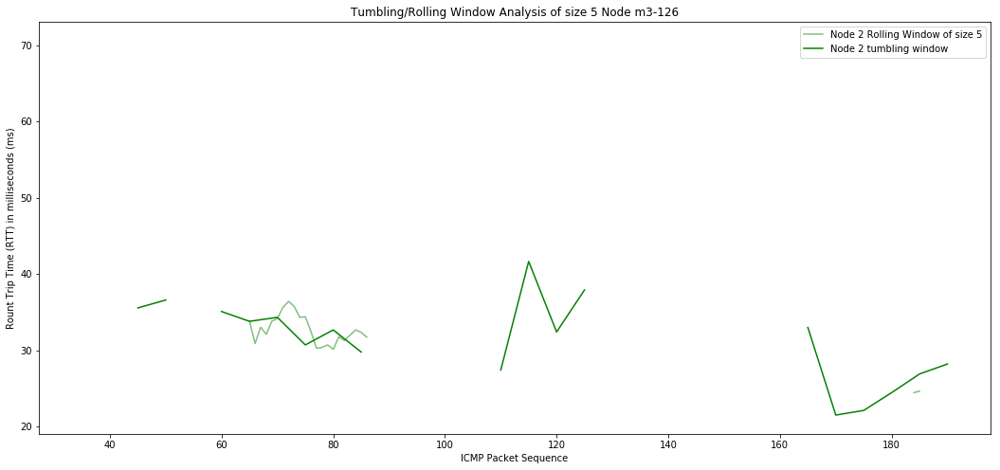

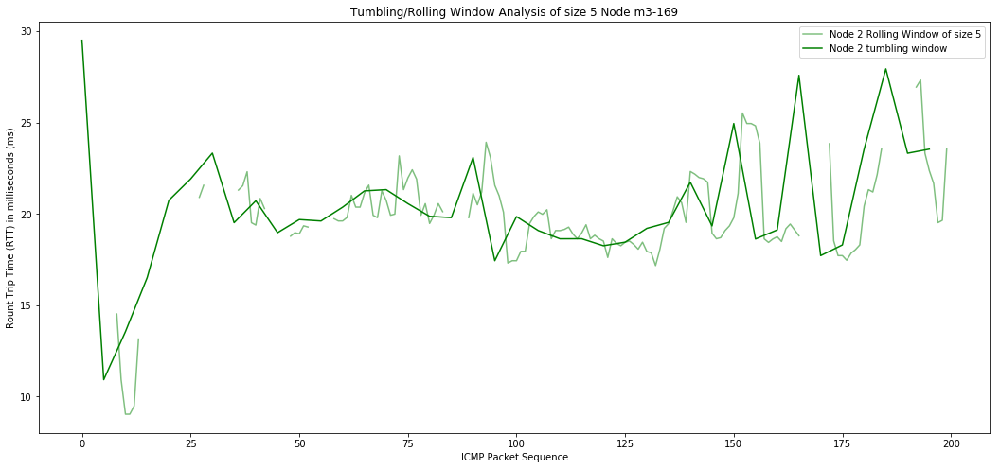

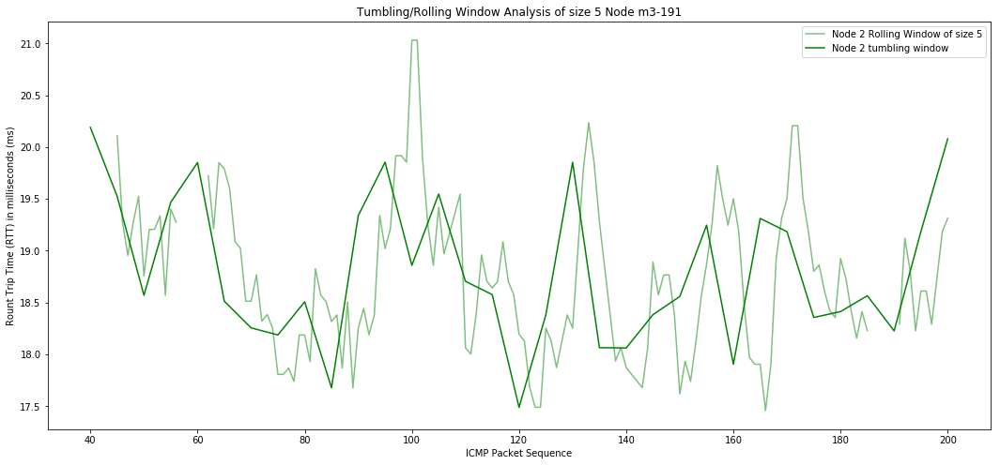

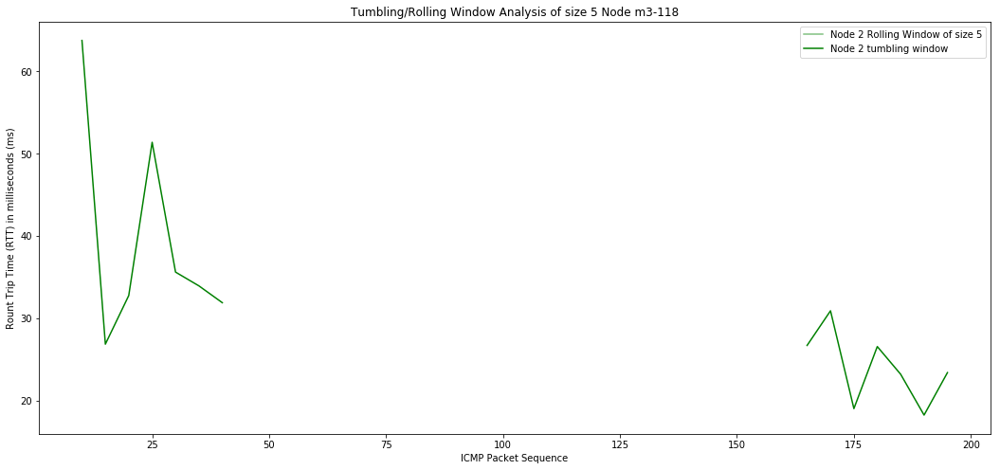

...

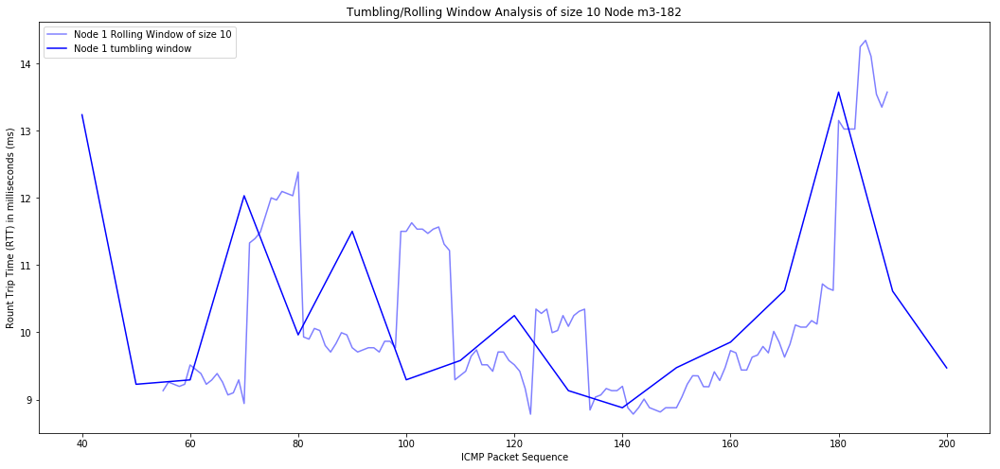

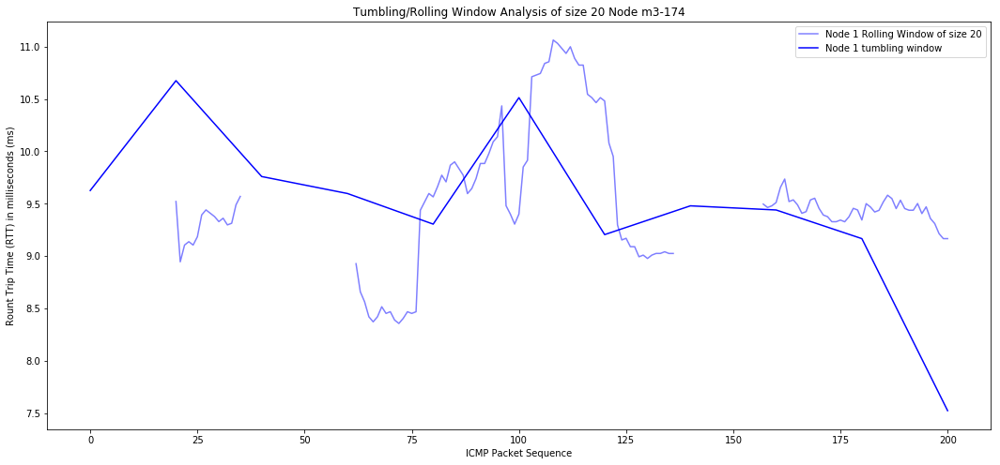

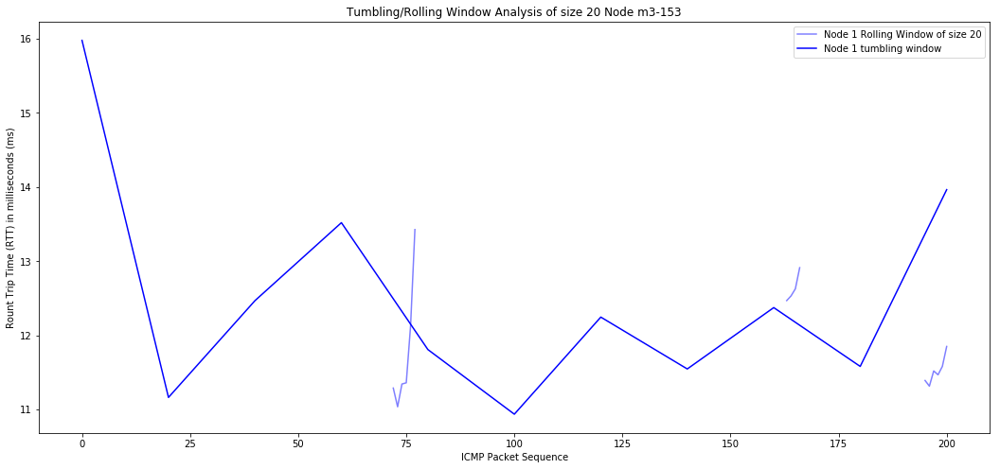

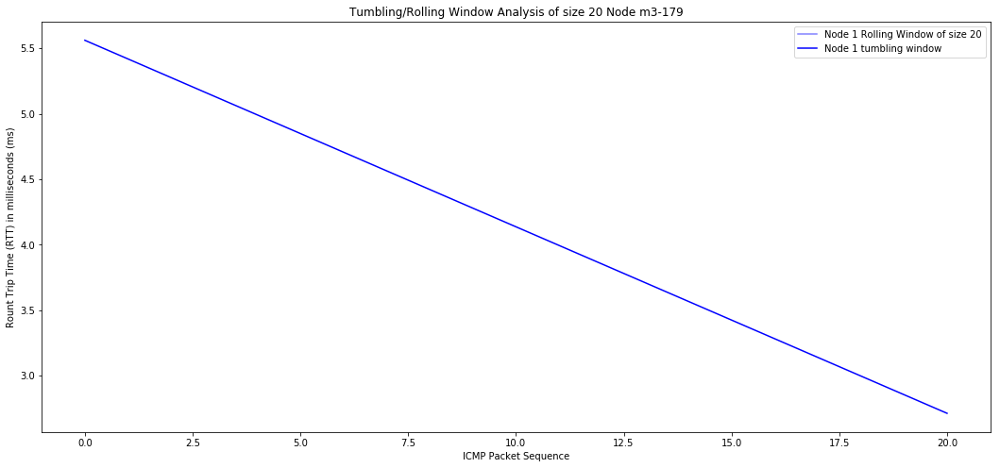

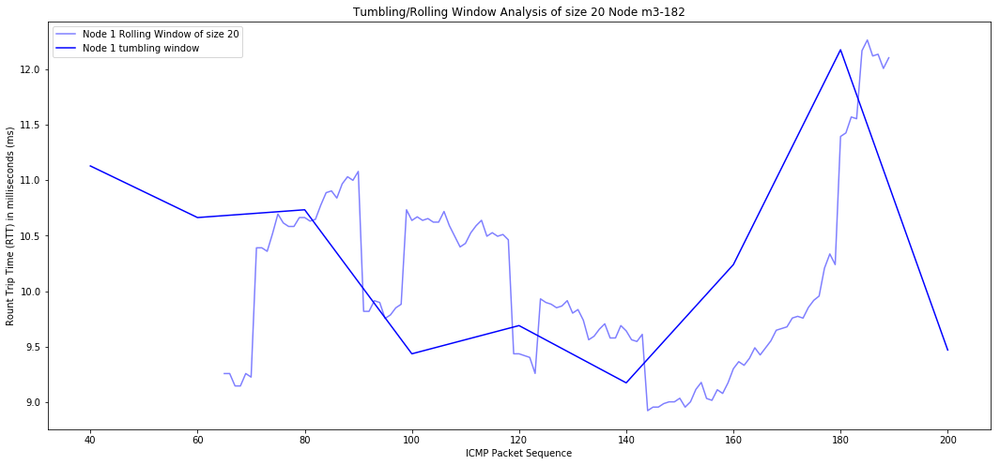

In [31]:
for hop in hops5.keys():
    for window_size in [5, 10, 20]: 
        for node in hops5[hop]:
            fig, ax = plt.subplots(figsize=(18, 8))
            plt.ylabel('Rount Trip Time (RTT) in milliseconds (ms)')
            plt.xlabel('ICMP Packet Sequence')

            plt.plot(nodes5[node].rolling(window_size).mean(), color=color[hop], alpha=0.5, label='Node ' + str(hop) + ' Rolling Window of size ' + str(window_size))
            plt.plot(nodes5[node].groupby(nodes5[node].index // window_size * window_size).mean(), color=color[hop], label='Node ' + str(hop) + ' tumbling window')

            plt.title('Tumbling/Rolling Window Analysis of size ' + str(window_size) + ' Node ' + str(node))
            plt.legend()

Packet loss in a tumbling window

../trace_analysis.py:159: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['node_id'] = addr['node_id'].convert_objects(convert_numeric=True)
../trace_analysis.py:175: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  addr['rank'] = rank['rank'].convert_objects(convert_numeric=True)
../trace_analysis.py:190: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use Series.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  rpl['node_id'] = rpl['node_id'].convert_objects(convert_numeric=True)


<Figure size 432x288 with 0 Axes>

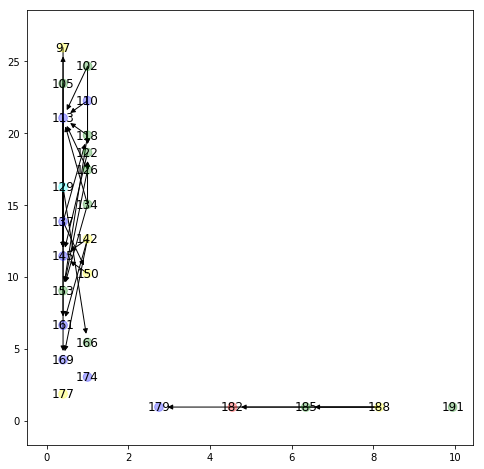

In [32]:
G4 = trace_analysis.produce_iotlab_topology(os.getcwd() + '/traces/', '2019-01JAN-30-2')

plt.clf()
fig = plt.figure(figsize=(8, 8))
nx.draw_networkx_nodes(G4, pos=nx.get_node_attributes(G4,'loc'), node_shape='.', node_color=list(nx.get_node_attributes(G4,'color').values()), alpha=0.3)
nx.draw_networkx_labels(G4, pos=nx.get_node_attributes(G4,'loc'), labels=nx.get_node_attributes(G4,'id'))
nx.draw_networkx_edges(G4, pos=nx.get_node_attributes(G4,'loc'))
plt.show()